# ***Google trends***
Youtube --1/1/2008-19/7/2024

In [ ]:
!pip install deep_translator

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 2.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
import nltk
import warnings
import wordcloud
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
from deep_translator import GoogleTranslator
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import geopandas as gpd
warnings.filterwarnings('ignore')
from mpl_toolkits.axes_grid1 import make_axes_locatable

Mounted at /content/drive


***MUNDIAL***

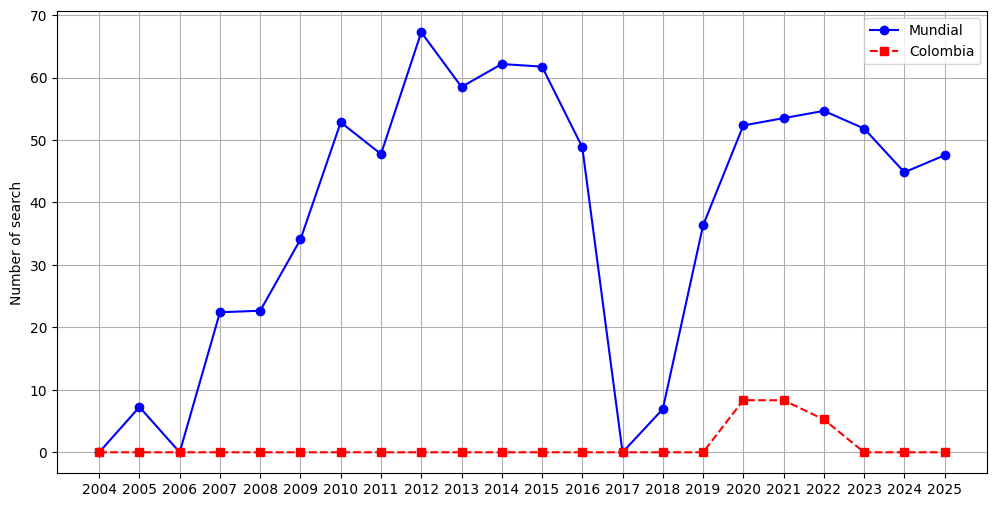

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/AGROSAVIA/multiTimeline (10).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()


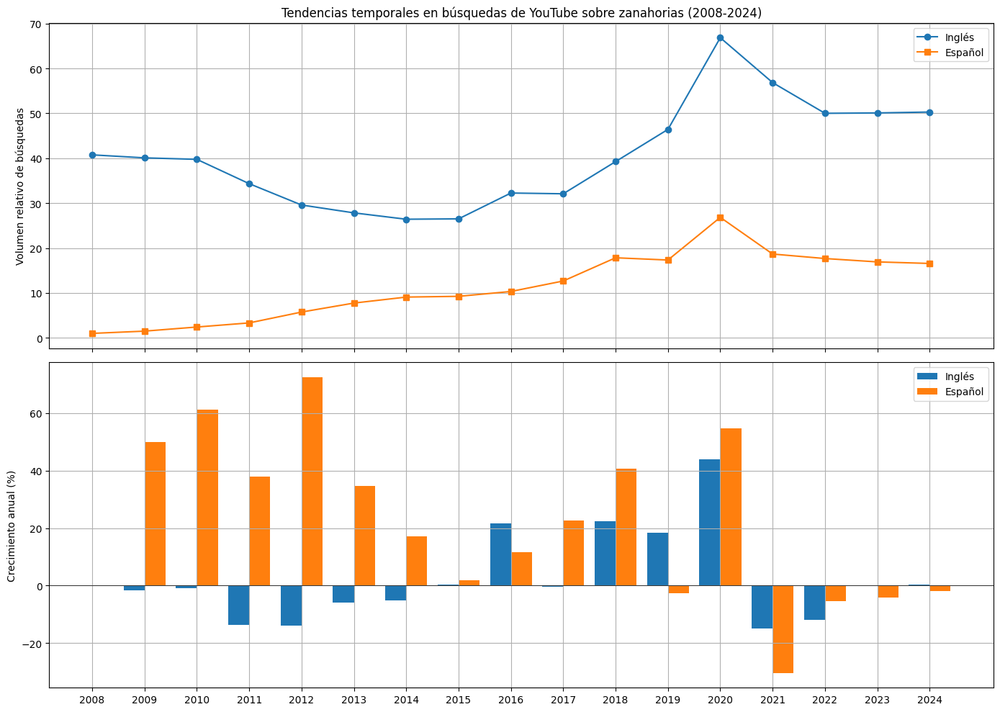

Resumen estadístico del volumen de búsquedas:
       carrot  zanahoria
count    17.0       17.0
mean     40.5       11.5
std      11.5        7.4
min      26.4        1.0
25%      32.1        5.8
50%      39.8       10.3
75%      50.0       17.3
max      66.8       26.8


In [ ]:
# Calcular crecimiento porcentual anual
df_anual['Crecimiento_ENG'] = df_anual[df.columns[1]].pct_change() * 100
df_anual['Crecimiento_ESP'] = df_anual[df.columns[2]].pct_change() * 100

# Gráfico mejorado
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Gráfico de líneas para volumen
ax1.plot(df_anual.index, df_anual[df.columns[1]], label='Inglés', marker='o', color='#1f77b4')
ax1.plot(df_anual.index, df_anual[df.columns[2]], label='Español', marker='s', color='#ff7f0e')
ax1.set_ylabel('Volumen relativo de búsquedas')
ax1.legend()
ax1.grid(True)
ax1.set_title('Tendencias temporales en búsquedas de YouTube sobre zanahorias (2008-2024)')

# Gráfico de barras para crecimiento
ax2.bar(df_anual.index-0.2, df_anual['Crecimiento_ENG'], width=0.4, label='Inglés', color='#1f77b4')
ax2.bar(df_anual.index+0.2, df_anual['Crecimiento_ESP'], width=0.4, label='Español', color='#ff7f0e')
ax2.axhline(0, color='black', linewidth=0.5)
ax2.set_ylabel('Crecimiento anual (%)')
ax2.legend()
ax2.grid(True)

plt.xticks(df_anual.index)
plt.tight_layout()
plt.show()

# Tabla resumen
print("Resumen estadístico del volumen de búsquedas:")
print(df_anual[[df.columns[1], df.columns[2]]].describe().round(1))

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Youtube/Mundial/relatedQueries (2).csv')
print(yt)

                              TOP;Count
0                   torta zanahoria;100
1                             torta;100
2                 torta de zanahoria;93
3                       la zanahoria;67
4                           ensalada;60
5              ensalada de zanahoria;51
6                     jugo zanahoria;31
7                  jugo de zanahoria;31
8             ensalada con zanahoria;29
9                 crema de zanahoria;25
10                   crema zanahoria;25
11             remolacha y zanahoria;12
12     como hacer torta de zanahoria;12
13        ensalada repollo zanahoria;11
14               ensalada de repollo;10
15                pollo con zanahoria;9
16                 arroz de zanahoria;8
17                  zanahoria recetas;7
18                arroz con zanahoria;7
19       ensalada repollo y zanahoria;7
20               zanahoria beneficios;7
21  ensalada de repollo con zanahoria;7
22    ensalada de repollo y zanahoria;6
23       torta de zanahoria sin horno;6


In [ ]:
yt[['TOP', 'Count']] = yt['TOP;Count'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;Count', 'TOP', 'Count'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

               TOP;Count                 TOP Count translated_TOP
0    torta zanahoria;100     torta zanahoria   100    Carrot cake
1              torta;100               torta   100          torta
2  torta de zanahoria;93  torta de zanahoria    93    Carrot cake
3        la zanahoria;67        la zanahoria    67     The carrot
4            ensalada;60            ensalada    60          salad


In [ ]:
yt['Count'] = pd.to_numeric(yt['Count'], errors='coerce')
yt = yt.dropna(subset=['Count'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['Count']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

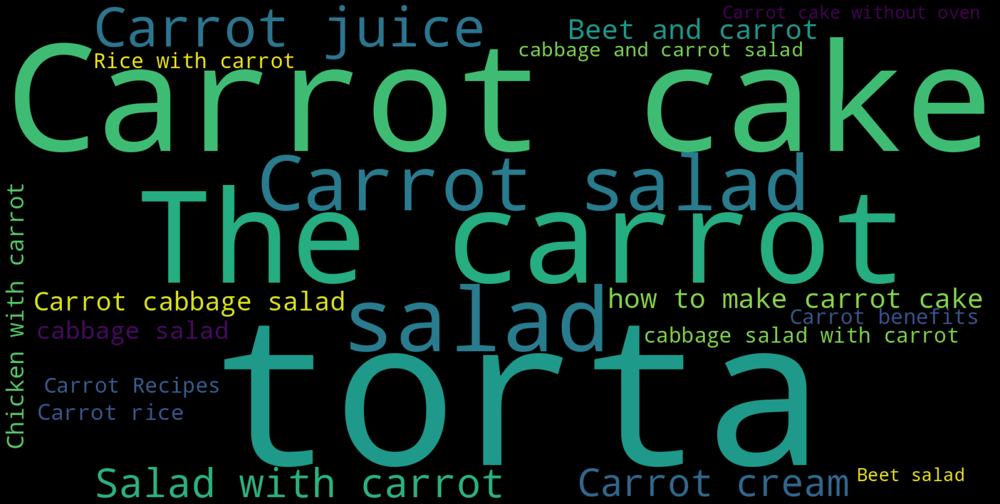

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                      TOP  Count  Percentage
0         torta zanahoria    100   13.755158
1                   torta    100   13.755158
2      torta de zanahoria     93   12.792297
3            la zanahoria     67    9.215956
4                ensalada     60    8.253095
5   ensalada de zanahoria     51    7.015131
6          jugo zanahoria     31    4.264099
7       jugo de zanahoria     31    4.264099
8  ensalada con zanahoria     29    3.988996
9      crema de zanahoria     25    3.438790


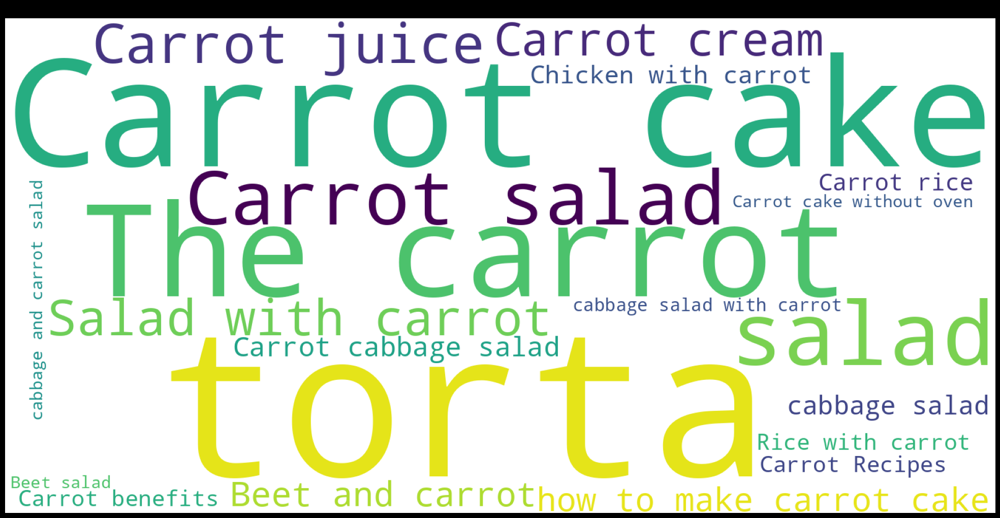

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['Count'].sum()
yt['Percentage'] = (yt['Count'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'Count', 'Percentage']].sort_values(by='Count', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['translated_TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Youtube/Mundial/relatedQueriesEN.csv')
print(yt)

                       TOP;COUNT
0                carrot cake;100
1               carrot recipe;80
2                carrot halwa;75
3                carrot juice;52
4              carrot recipes;30
5          carrot cake recipe;27
6                 cake recipe;27
7                  pufferfish;24
8                 carrot rice;24
9           pufferfish carrot;24
10                fish carrot;22
11   pufferfish eating carrot;20
12               carrot curry;17
13                carrot song;16
14         fish eating carrot;15
15              regina carrot;15
16                carrot soup;15
17         puffer fish carrot;14
18                puffer fish;14
19             carrot poriyal;14
20                 carrot top;13
21                baby carrot;11
22                 carrot fry;11
23  puffer fish eating carrot;11
24                 carrot oil;11


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

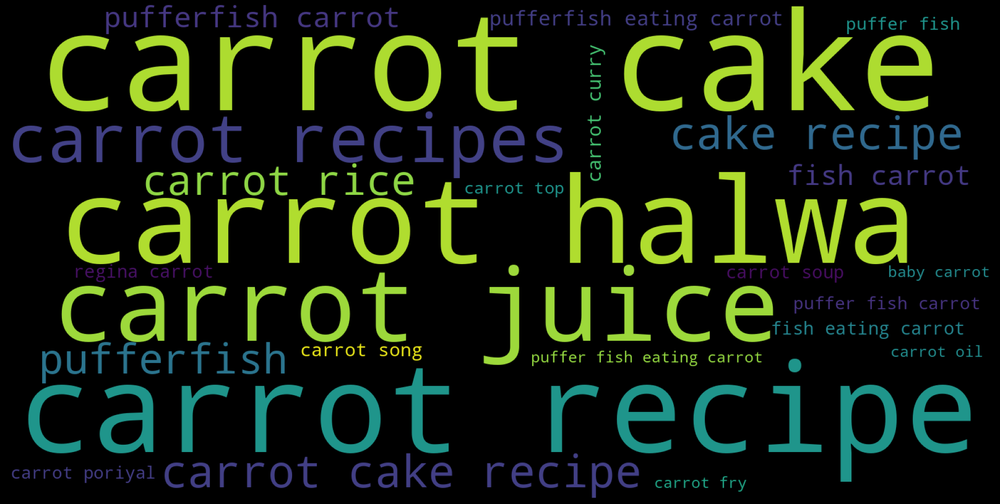

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                  TOP  COUNT  Percentage
0         carrot cake    100   14.662757
1       carrot recipe     80   11.730205
2        carrot halwa     75   10.997067
3        carrot juice     52    7.624633
4      carrot recipes     30    4.398827
5  carrot cake recipe     27    3.958944
6         cake recipe     27    3.958944
7          pufferfish     24    3.519062
8         carrot rice     24    3.519062
9   pufferfish carrot     24    3.519062


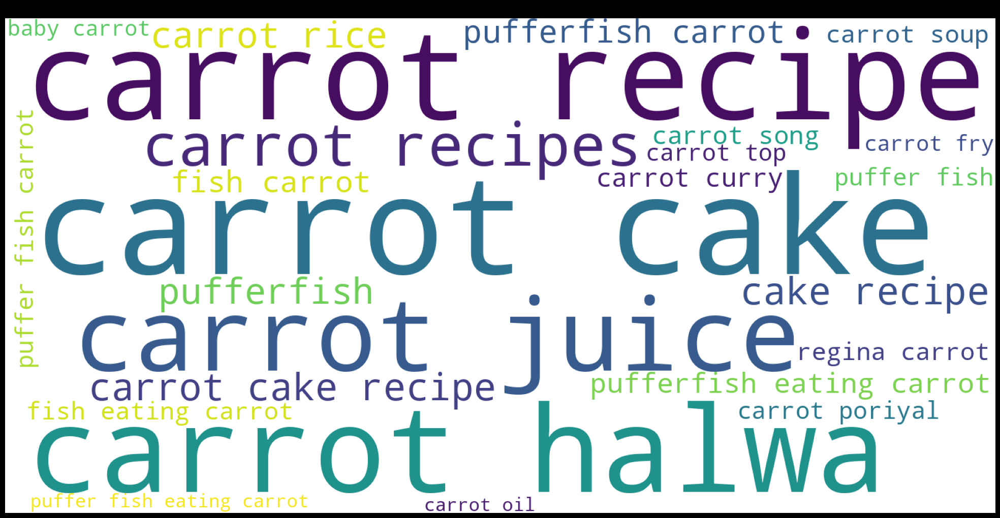

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
import pandas as pd

yt = pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/AGROSAVIA/geoMap (5).csv', encoding='latin-1')
print(yt.head())


       Pais  Count
0    España  100.0
1    Brasil   57.0
2      Perú   14.0
3     Chile   14.0
4  Portugal   14.0


In [ ]:
import pandas as pd

# Cargar el archivo
yt = pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/AGROSAVIA/geoMap (5).csv', encoding='latin-1')

# Verificar los nombres de las columnas
print("Columnas disponibles:")
print(yt.columns.tolist())
print("\nPrimeras filas:")
print(yt.head())

Columnas disponibles:
['Pais', 'Count']

Primeras filas:
       Pais  Count
0    España  100.0
1    Brasil   57.0
2      Perú   14.0
3     Chile   14.0
4  Portugal   14.0


In [ ]:
yt['Count'] = pd.to_numeric(yt['Count'], errors='coerce')
yt = yt.dropna(subset=['Count'])

# Verificar el resultado
print("\nDataFrame después del procesamiento:")
print(yt.head())
print(f"\nTotal de filas: {len(yt)}")
print(f"Tipo de datos de Count: {yt['Count'].dtype}")


DataFrame después del procesamiento:
       Pais  Count
0    España  100.0
1    Brasil   57.0
2      Perú   14.0
3     Chile   14.0
4  Portugal   14.0

Total de filas: 7
Tipo de datos de Count: float64


Países en yt: 7
Países en world: 177
Países que coincidieron: 6 de 7


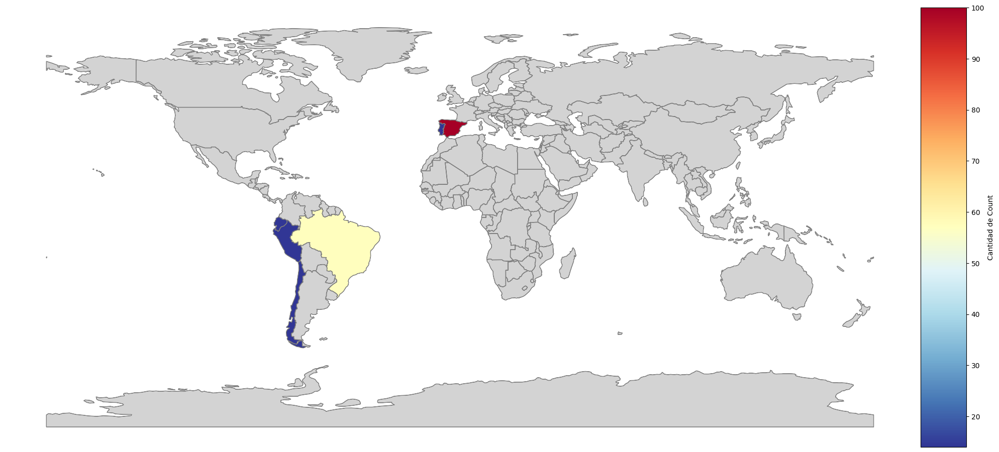


Países que no coincidieron:
['Francia']


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd

# Cargar los datos de YouTube
yt = pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/AGROSAVIA/geoMap (5).csv', encoding='latin-1')
yt['Count'] = pd.to_numeric(yt['Count'], errors='coerce')
yt = yt.dropna(subset=['Count'])

# Estandarizar nombres de países ANTES del merge
yt['Pais'] = yt['Pais'].replace({
    'USA': 'United States of America',
    'UK': 'United Kingdom',
    'San Pedro y Miquelón': 'Saint Pierre and Miquelon',
    'Corea del Sur': 'South Korea',
    'Corea del Norte': 'North Korea',
    'República Democrática del Congo': 'Democratic Republic of the Congo',
    'Costa Rica': 'Costa Rica',
    'Republica Dominicana': 'Dominican Republic',
    'España': 'Spain',
    'Brasil': 'Brazil',
    'Perú': 'Peru',
    'Chile': 'Chile',
    'Portugal': 'Portugal',
    # Agrega más mapeos según necesites
})

# Cargar el mapa mundial
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Verificar coincidencias antes del merge
print("Países en yt:", len(yt))
print("Países en world:", len(world))

# Hacer el merge
world_merged = world.merge(yt, how='left', left_on='ADMIN', right_on='Pais')

# Verificar cuántos países coincidieron
matched = world_merged['Count'].notna().sum()
print(f"Países que coincidieron: {matched} de {len(yt)}")

# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Dibujar el mapa
world.boundary.plot(ax=ax, linewidth=1, color='gray')
world_merged.plot(column='Count', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,
                 legend_kwds={'label': "Cantidad de Count",
                             'orientation': "vertical"},
                 missing_kwds={"color": "lightgrey", "label": "No data"},
                 edgecolor='black', linewidth=0.5)

# Estilo del mapa
ax.set_axis_off()

# Mostrar el mapa
plt.tight_layout()
plt.show()

# Opcional: verificar países que no coincidieron
non_matched = yt[~yt['Pais'].isin(world['ADMIN'])]
if len(non_matched) > 0:
    print("\nPaíses que no coincidieron:")
    print(non_matched['Pais'].tolist())

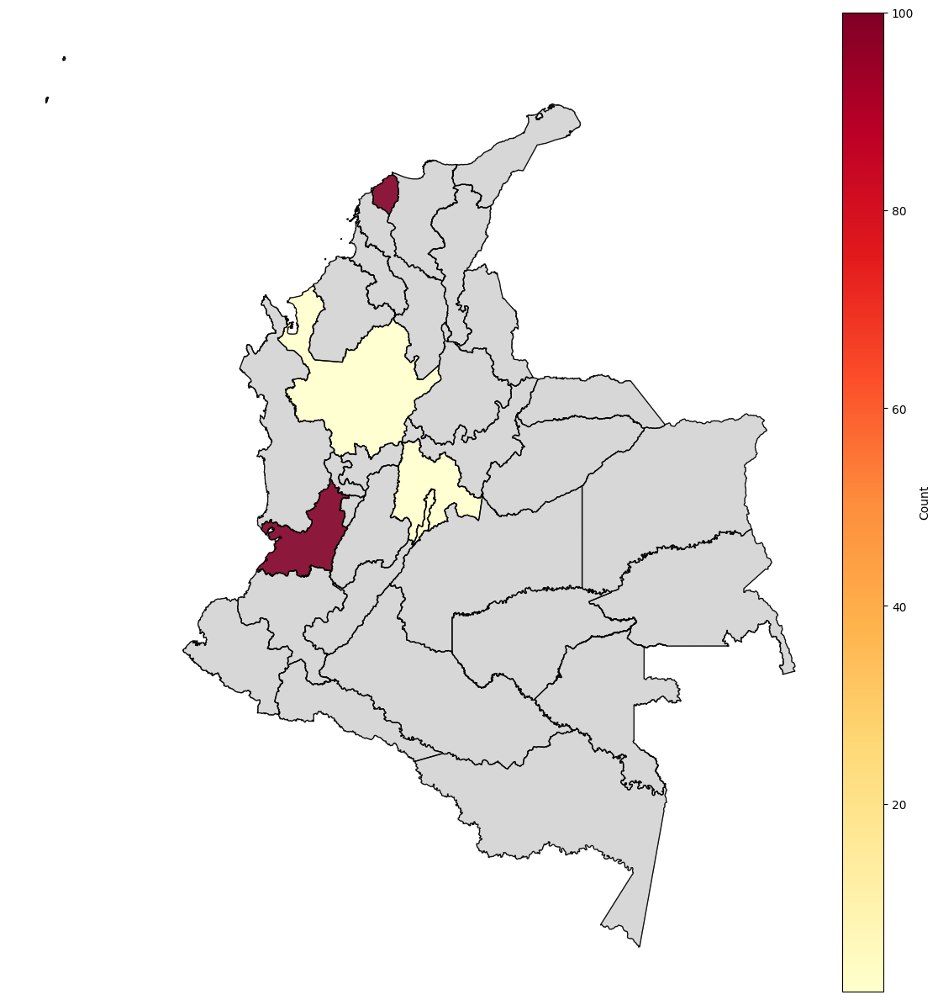


RESUMEN ESTADÍSTICO
Total de visitas: 203.0
Promedio por departamento: 40.6
Máximo: 100.0 (Valle del Cauca)
Mínimo: 1.0 (Bogotá)

Top 5 departamentos:
1. Valle del Cauca: 100.0 visitas
2. Atlántico: 100.0 visitas
3. Bogotá: 1.0 visitas
4. Cundinamarca: 1.0 visitas
5. Antioquia: 1.0 visitas


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import numpy as np
import unicodedata

# Cargar los datos de YouTube para Colombia
yt = pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/AGROSAVIA/geoMap (6).csv', encoding='latin-1')

# Renombrar la columna 'Región' a 'Departamento'
yt = yt.rename(columns={'Región': 'Departamento'})
yt['Count'] = pd.to_numeric(yt['Count'], errors='coerce')
yt = yt.dropna(subset=['Count'])

# Cargar el shapefile de Colombia
path_colombia = '/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/AGROSAVIA/Colombia_COVID19_Coronavirus_Departamento.zip'
colombia = gpd.read_file(path_colombia)

# Función para normalizar nombres (quitar acentos y convertir a mayúsculas)
def normalizar_nombre(nombre):
    if pd.isna(nombre):
        return nombre
    # Convertir a string, quitar acentos y poner en mayúsculas
    nombre = str(nombre)
    nombre = unicodedata.normalize('NFKD', nombre).encode('ASCII', 'ignore').decode('ASCII')
    return nombre.upper().strip()

# Normalizar nombres en ambos datasets
yt['Departamento_normalizado'] = yt['Departamento'].apply(normalizar_nombre)
colombia['NOMBRE_DPT_normalizado'] = colombia['NOMBRE_DPT'].apply(normalizar_nombre)

# Mapeo manual para casos especiales
mapeo_manual = {
    'BOGOTA': 'BOGOTA, D.C.',
}

# Aplicar mapeo manual
yt['Departamento_normalizado'] = yt['Departamento_normalizado'].replace(mapeo_manual)

# Hacer merge de los datos usando los nombres normalizados
colombia_merged = colombia.merge(yt, how='left', left_on='NOMBRE_DPT_normalizado', right_on='Departamento_normalizado')

# Crear el mapa
fig, ax = plt.subplots(1, 1, figsize=(16, 12))

# Configurar el colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# Dibujar el mapa base (todos los departamentos)
colombia.boundary.plot(ax=ax, linewidth=1, color='black', alpha=0.5)

# Dibujar los departamentos con datos (SIN ETIQUETAS)
colombia_merged.plot(column='Count', ax=ax, legend=True, cmap='YlOrRd', cax=cax,
                    legend_kwds={'label': "Count",
                                'orientation': "vertical",
                                'shrink': 0.8},
                    missing_kwds={"color": "lightgrey", "edgecolor": "black", "label": "Sin datos"},
                    edgecolor='black', linewidth=0.8, alpha=0.9)

# Personalizar el mapa

ax.set_axis_off()



plt.tight_layout()
plt.show()

# Mostrar tabla resumen en consola
print("\n" + "="*50)
print("RESUMEN ESTADÍSTICO")
print("="*50)
print(f"Total de visitas: {yt['Count'].sum():,}")
print(f"Promedio por departamento: {yt['Count'].mean():.1f}")
print(f"Máximo: {yt['Count'].max()} ({yt.loc[yt['Count'].idxmax(), 'Departamento']})")
print(f"Mínimo: {yt['Count'].min()} ({yt.loc[yt['Count'].idxmin(), 'Departamento']})")

print("\nTop 5 departamentos:")
top5 = yt.nlargest(5, 'Count')
for i, (_, row) in enumerate(top5.iterrows(), 1):
    print(f"{i}. {row['Departamento']}: {row['Count']} visitas")

In [ ]:
yt[['Pais', 'Count']] = yt['Pais;Count'].str.split(';', expand=True)
yt['Count'] = pd.to_numeric(yt['Count'], errors='coerce')
yt = yt.dropna(subset=['Count'])


KeyError: 'Pais;Count'

In [ ]:
import geopandas as gpd

# Cambia esta ruta por la ruta real donde descomprimiste el archivo
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Continúa con tu análisis


In [ ]:
yt['Country'] = yt['Pais'].replace({
    'USA': 'United States of America',
    'UK': 'United Kingdom',
    'San Pedro y Miquelón': 'Saint Pierre and Miquelon',
    'Corea del Sur': 'South Korea',
    'Corea del Norte': 'North Korea',
    'República Democrática del Congo': 'Democratic Republic of the Congo',
    'Costa Rica': 'Costa Rica',
    'Republica Dominicana': 'Dominican Republic',
})

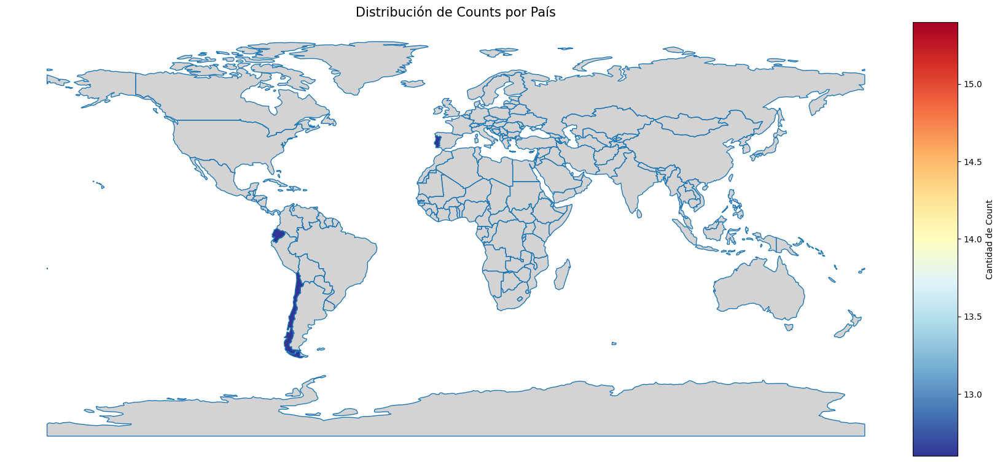

In [ ]:
# Unir los datos del DataFrame con el GeoDataFrame del mundo
world = world.merge(yt, how='left', left_on='ADMIN', right_on='Pais')


# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

world.boundary.plot(ax=ax, linewidth=1)
world.plot(column='Count', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
           legend_kwds={'label': "Cantidad de Count",
                        'orientation': "vertical"},
           missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por País', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()


***COLOMBIA***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Youtube/Colombia/relatedQueries (1).csv')
print(yt)

                              TOP;COUNT
0                   torta zanahoria;100
1                             torta;100
2                 torta de zanahoria;93
3                       la zanahoria;67
4                           ensalada;60
5              ensalada de zanahoria;51
6                     jugo zanahoria;31
7                  jugo de zanahoria;31
8             ensalada con zanahoria;29
9                 crema de zanahoria;25
10                   crema zanahoria;25
11             remolacha y zanahoria;12
12     como hacer torta de zanahoria;12
13        ensalada repollo zanahoria;11
14               ensalada de repollo;10
15                pollo con zanahoria;9
16                 arroz de zanahoria;8
17                  zanahoria recetas;7
18                arroz con zanahoria;7
19       ensalada repollo y zanahoria;7
20               zanahoria beneficios;7
21  ensalada de repollo con zanahoria;7
22    ensalada de repollo y zanahoria;6
23       torta de zanahoria sin horno;6


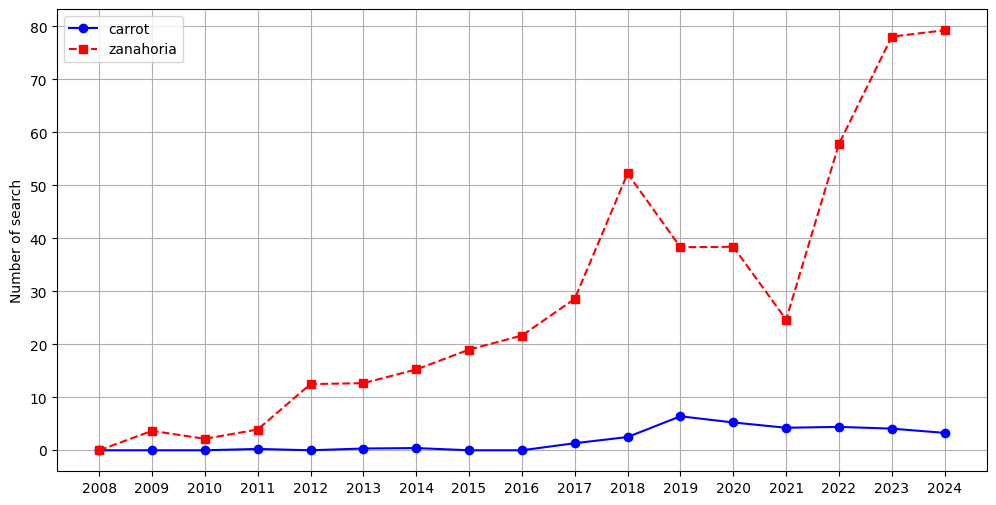

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Youtube/Colombia/multiTimeline (2).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

               TOP;COUNT                 TOP COUNT translated_TOP
0    torta zanahoria;100     torta zanahoria   100    Carrot cake
1              torta;100               torta   100          torta
2  torta de zanahoria;93  torta de zanahoria    93    Carrot cake
3        la zanahoria;67        la zanahoria    67     The carrot
4            ensalada;60            ensalada    60          salad


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

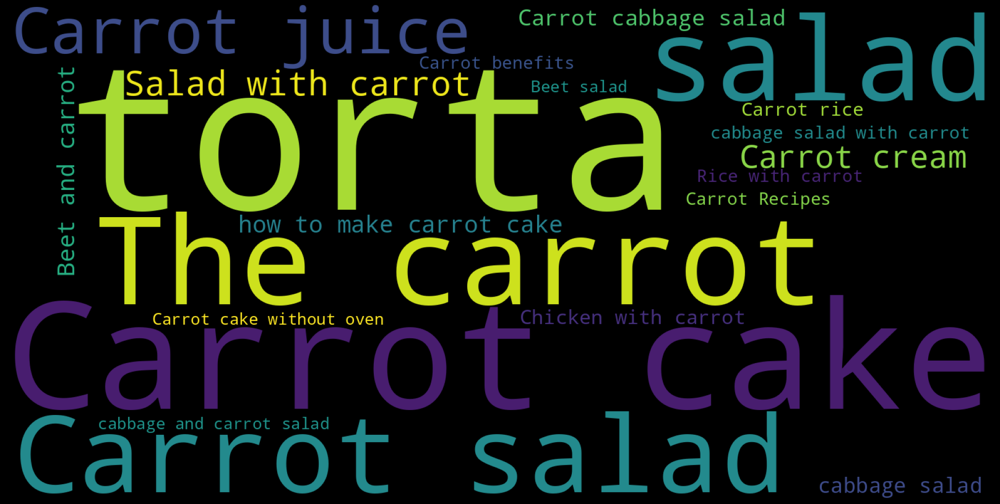

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                      TOP  COUNT  Percentage
0         torta zanahoria    100   13.755158
1                   torta    100   13.755158
2      torta de zanahoria     93   12.792297
3            la zanahoria     67    9.215956
4                ensalada     60    8.253095
5   ensalada de zanahoria     51    7.015131
6          jugo zanahoria     31    4.264099
7       jugo de zanahoria     31    4.264099
8  ensalada con zanahoria     29    3.988996
9      crema de zanahoria     25    3.438790


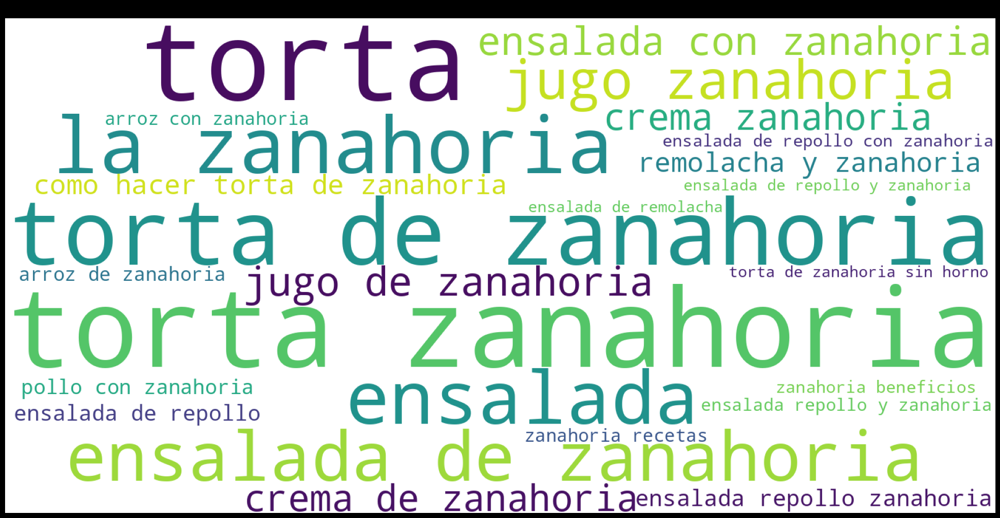

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Youtube/Colombia/geoMap (2).csv')
print(yt)

                      TOP;COUNT
0                   Caquetá;100
1                   Guaviare;91
2                  Antioquia;89
3                     Boyacá;86
4                     Caldas;85
5                     Arauca;75
6                    Vichada;74
7                   Putumayo;73
8                      Huila;73
9                    Quindío;72
10                    Bogotá;71
11                     Chocó;71
12           Valle del Cauca;71
13                 Santander;70
14                      Meta;70
15                 Risaralda;68
16                     Cauca;66
17                 Atlántico;66
18                La Guajira;65
19                     Cesar;64
20                  Casanare;64
21                     Sucre;62
22                    Nariño;62
23                   Córdoba;61
24                 Magdalena;60
25                   Bolívar;60
26                    Tolima;57
27        Norte de Santander;57
28  San Andrés y Providencia;54
29              Cundinamarca;44


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
colombia = gpd.read_file('/content/drive/MyDrive/Zanahoria/Google/Colombia_COVID19_Coronavirus_Departamento.zip')
print(colombia.head())

DataSourceError: '/vsizip//content/drive/MyDrive/Zanahoria/Google/Colombia_COVID19_Coronavirus_Departamento.zip' does not exist in the file system, and is not recognized as a supported dataset name.

In [ ]:
# Asegurar que los nombres de los departamentos en el shapefile coincidan con los del DataFrame
yt['TOP'] = yt['TOP'].replace({
    # Agrega mapeos según sea necesario, por ejemplo:
       'Bogotá': 'BOGOTÁ, D.C.',
    'Atlántico': 'ATLÁNTICO',
    'Antioquia': 'ANTIOQUIA',
    'Boyacá': 'BOYACÁ',
    'Caldas': 'CALDAS',
    'Arauca': 'ARAUCAS',
    'Vichada': 'VICHADA',
    'Putumayo': 'PUTUMAYO',
    'Huila': 'HUILA',
    'Quindío': 'QUINDÍO',
    'Valle del Cauca': 'VALLE DEL CAUCA',
    'Santander': 'SANTANDER',
    'Meta': 'META',
    'Risaralda': 'RISARALDA',
    'Cauca': 'CAUCA',
    'La Guajira': 'LA GUAJIRA',
    'Cesar': 'CESAR',
    'Casanare': 'CASANARE',
    'Sucre': 'SUCRE',
    'Nariño': 'NARIÑO',
    'Córdoba': 'CÓRDOBA',
    'Magdalena': 'MAGDALENA',
    'Bolívar': 'BOLÍVAR',
    'Tolima': 'TOLIMA',
    'Norte de Santander': 'NORTE DE SANTANDER',
    'San Andrés y Providencia': 'SAN ANDRÉS Y PROVIDENCIA',
    'Cundinamarca': 'CUNDINAMARCA',
})
    # ...

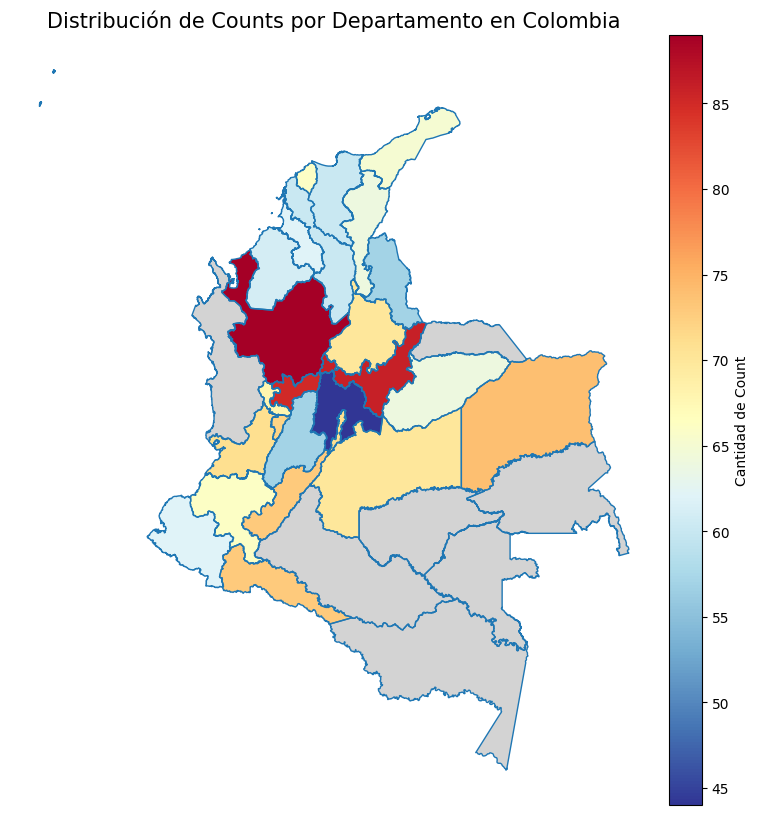

In [ ]:
# Limpiar el GeoDataFrame de columnas innecesarias (opcional)
# Asegúrate de mantener solo las columnas necesarias para el merge
colombia = colombia[['NOMBRE_DPT', 'geometry']]

# Unir los datos del DataFrame con el GeoDataFrame de Colombia
colombia = colombia.merge(yt, how='left', left_on='NOMBRE_DPT', right_on='TOP')

# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

colombia.boundary.plot(ax=ax, linewidth=1)
colombia.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
              legend_kwds={'label': "Cantidad de Count",
                           'orientation': "vertical"},
              missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por Departamento en Colombia', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()


WEB --1/1/2008-19/7/2024

***MUNDIAL***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/Mundial/relatedQueries (1) (1).csv')
print(yt)

                   TOP;COUNT
0           la zanahoria;100
1       jugo de zanahoria;32
2        pastel zanahoria;32
3         crema zanahoria;30
4     pastel de zanahoria;27
5      crema de zanahoria;26
6         tarta zanahoria;24
7         torta zanahoria;24
8      torta de zanahoria;22
9   ensalada de zanahoria;21
10     tarta de zanahoria;20
11               bizcocho;20
12     bizcocho zanahoria;19
13   zanahoria beneficios;18
14  bizcocho de zanahoria;17
15                recetas;13
16      recetas zanahoria;12
17  zanahoria propiedades;12
18                 queque;12


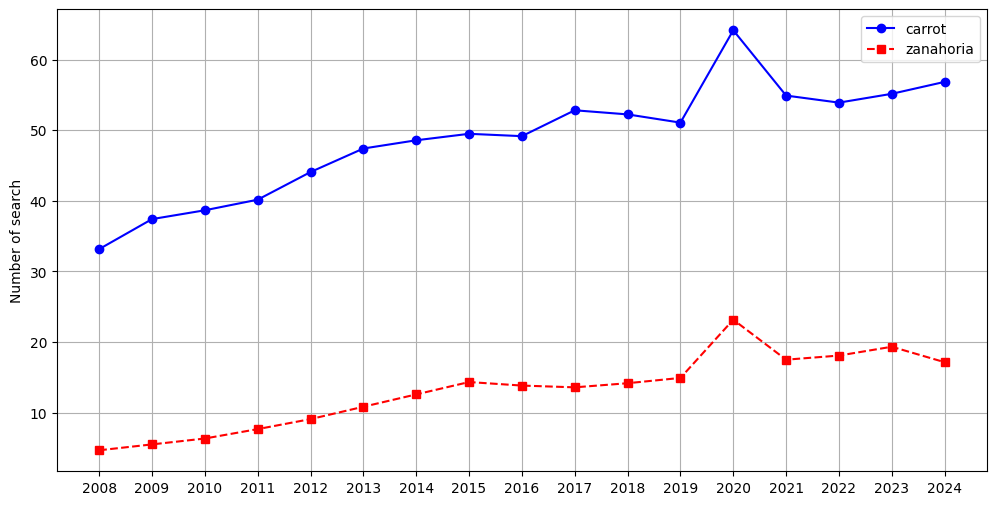

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/Mundial/ORIGINALES/multiTimeline (5).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

                TOP;COUNT                  TOP COUNT translated_TOP
0        la zanahoria;100         la zanahoria   100     The carrot
1    jugo de zanahoria;32    jugo de zanahoria    32   Carrot juice
2     pastel zanahoria;32     pastel zanahoria    32    Carrot cake
3      crema zanahoria;30      crema zanahoria    30   Carrot cream
4  pastel de zanahoria;27  pastel de zanahoria    27    Carrot cake


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

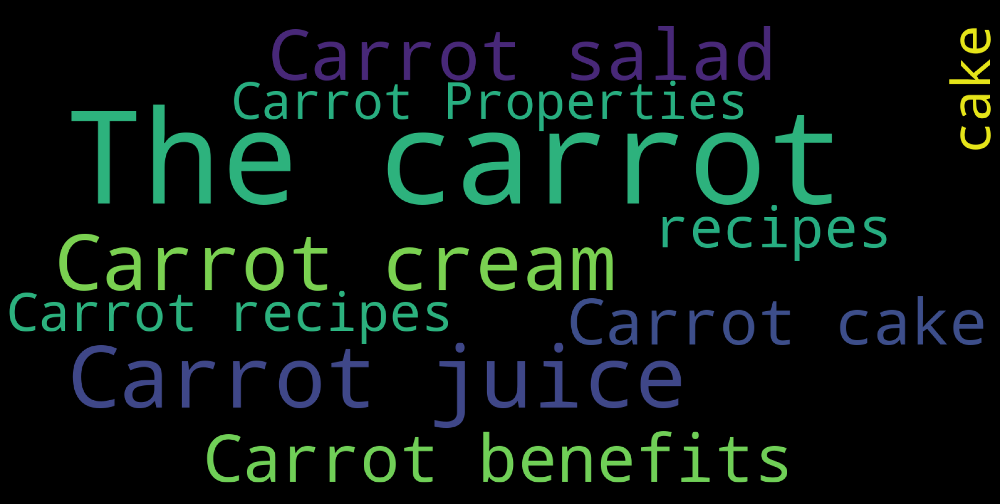

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                     TOP  COUNT  Percentage
0           la zanahoria    100   20.790021
1      jugo de zanahoria     32    6.652807
2       pastel zanahoria     32    6.652807
3        crema zanahoria     30    6.237006
4    pastel de zanahoria     27    5.613306
5     crema de zanahoria     26    5.405405
6        tarta zanahoria     24    4.989605
7        torta zanahoria     24    4.989605
8     torta de zanahoria     22    4.573805
9  ensalada de zanahoria     21    4.365904


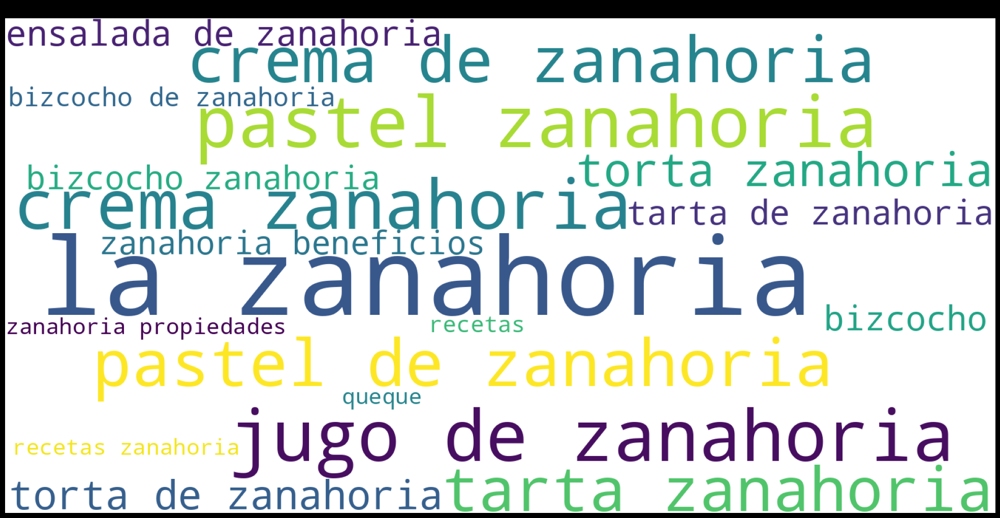

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/Mundial/relatedQueries (2).csv')
print(yt)

                TOP;COUNT
0         carrot cake;100
1                 cake;97
2        carrot recipe;53
3   recipe carrot cake;31
4          carrot soup;27
5           the carrot;23
6         carrot juice;19
7       carrot recipes;16
8           carrot top;15
9         carrot salad;11
10             carrots;11
11      calories carrot;9
12      carrot benefits;8
13       carrot muffins;7
14           carrot oil;7
15          baby carrot;6
16         sweet carrot;5
17     best carrot cake;5
18        purple carrot;5
19   carrot soup recipe;5
20   calories in carrot;5


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

               TOP;COUNT                 TOP COUNT      translated_TOP
0        carrot cake;100         carrot cake   100         carrot cake
1                cake;97                cake    97                cake
2       carrot recipe;53       carrot recipe    53       carrot recipe
3  recipe carrot cake;31  recipe carrot cake    31  recipe carrot cake
4         carrot soup;27         carrot soup    27         carrot soup


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

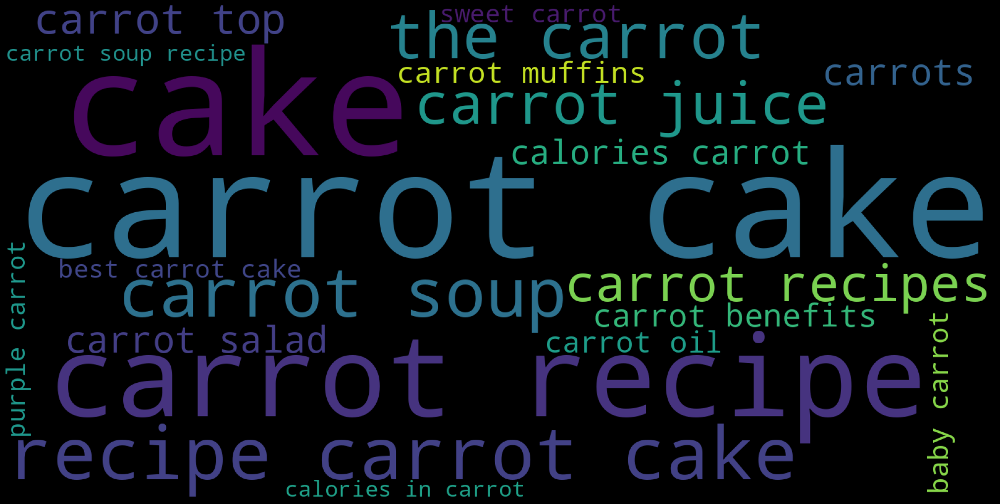

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                  TOP  COUNT  Percentage
0         carrot cake    100   21.505376
1                cake     97   20.860215
2       carrot recipe     53   11.397849
3  recipe carrot cake     31    6.666667
4         carrot soup     27    5.806452
5          the carrot     23    4.946237
6        carrot juice     19    4.086022
7      carrot recipes     16    3.440860
8          carrot top     15    3.225806
9        carrot salad     11    2.365591


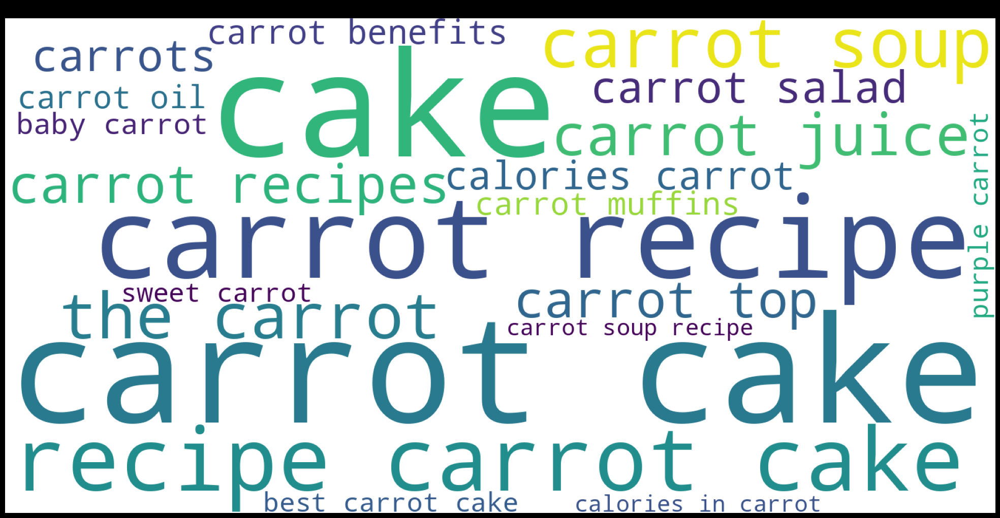

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/Mundial/geoMap (2) (1).csv')
print(yt)

                    Pais;COUNT
0                  Uruguay;100
1                   Bolivia;94
2                     Chile;90
3                 Guatemala;89
4                   Ecuador;84
..                         ...
245                    Kosovo;
246                     Yemen;
247                   Liberia;
248                Afganistán;
249  Islas Marianas del Norte;

[250 rows x 1 columns]


In [ ]:
yt[['Pais', 'COUNT']] = yt['Pais;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
import geopandas as gpd

# Cambia esta ruta por la ruta real donde descomprimiste el archivo
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Continúa con tu análisis


In [ ]:
yt['Country'] = yt['Pais'].replace({
    'USA': 'United States of America',
    'UK': 'United Kingdom',
    'San Pedro y Miquelón': 'Saint Pierre and Miquelon',
    'Corea del Sur': 'South Korea',
    'Corea del Norte': 'North Korea',
    'República Democrática del Congo': 'Democratic Republic of the Congo',
    'Costa Rica': 'Costa Rica',
    'Republica Dominicana': 'Dominican Republic',
})

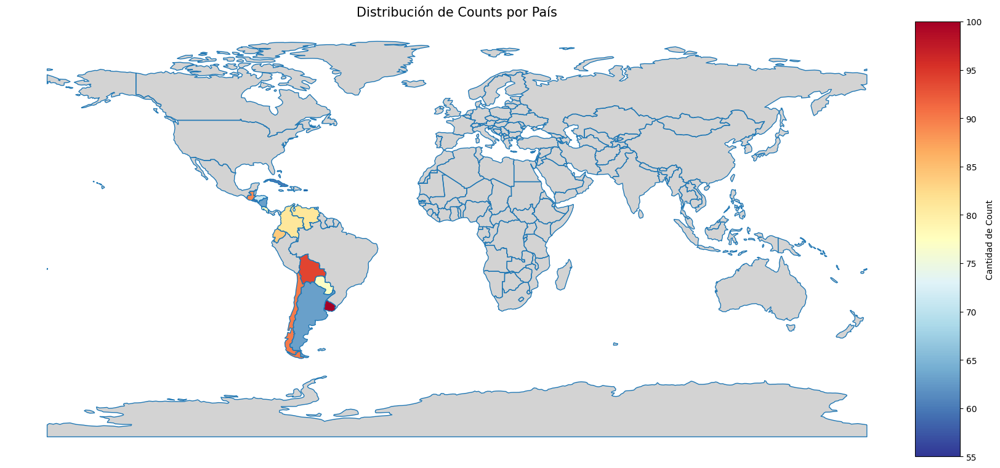

In [ ]:
# Unir los datos del DataFrame con el GeoDataFrame del mundo
world = world.merge(yt, how='left', left_on='ADMIN', right_on='Pais')


# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

world.boundary.plot(ax=ax, linewidth=1)
world.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
           legend_kwds={'label': "Cantidad de Count",
                        'orientation': "vertical"},
           missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por País', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

***COLOMBIA***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/Colombia/geoMap.csv')
print(yt)

                                                    Categoría: Todas las categorías
Región                   carrot: (1/1/08 - 19/7/24)   zanahoria: (1/1/08 - 19/7/24)
San Andrés y Providencia 8 %                                                   92 %
Caquetá                  3 %                                                   97 %
Bogotá                   4 %                                                   96 %
Magdalena                4 %                                                   96 %
Quindío                  3 %                                                   97 %
Atlántico                5 %                                                   95 %
Boyacá                   3 %                                                   97 %
Antioquia                3 %                                                   97 %
Caldas                   2 %                                                   98 %
Bolívar                  4 %                                                

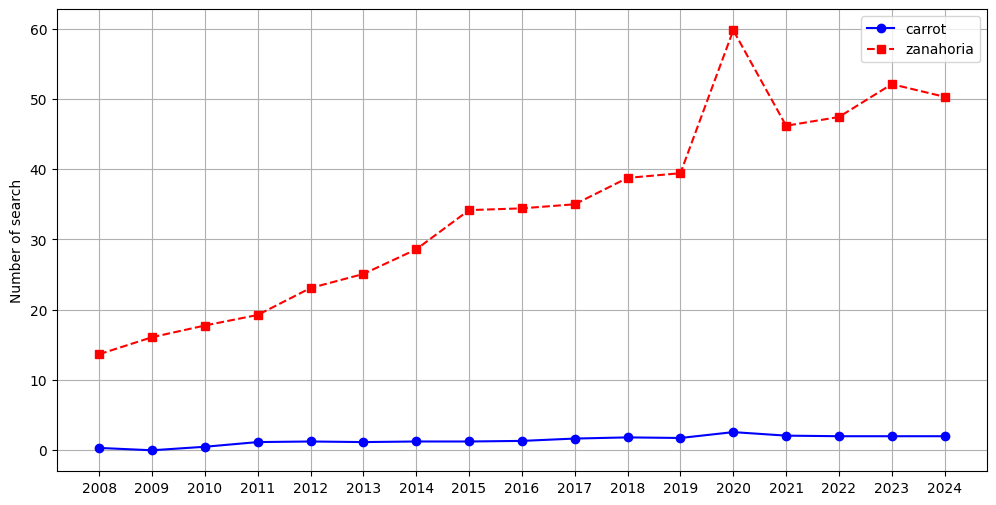

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Web/Colombia/multiTimeline (4).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

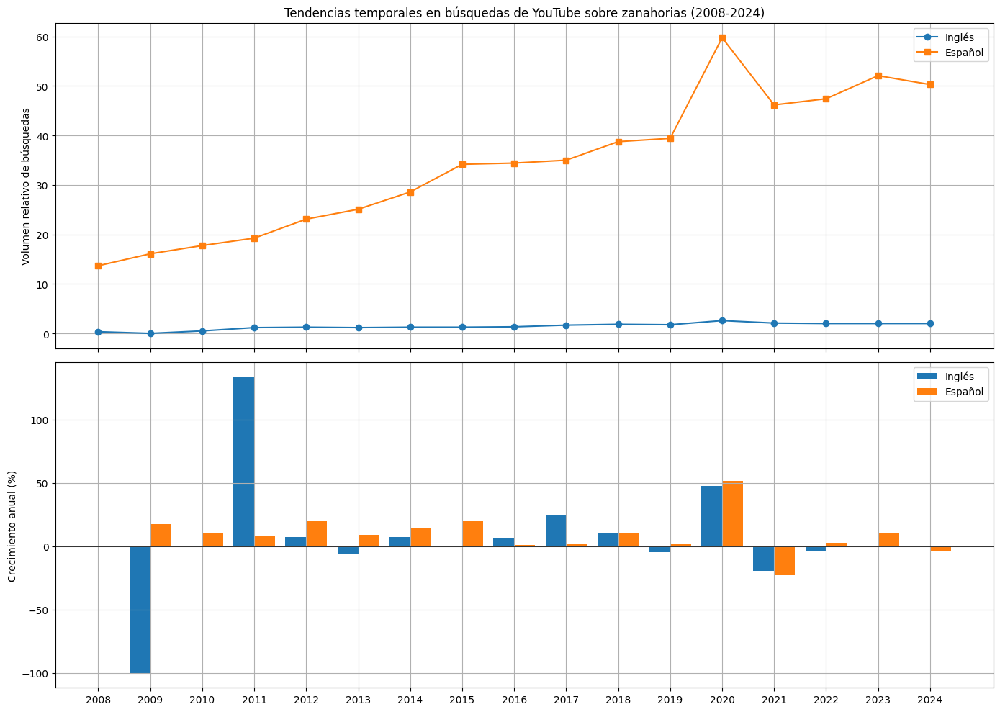

Resumen estadístico del volumen de búsquedas:
       carrot  zanahoria
count    17.0       17.0
mean      1.4       34.2
std       0.7       13.9
min       0.0       13.7
25%       1.2       23.1
50%       1.3       34.4
75%       2.0       46.2
max       2.6       59.8


In [ ]:
# Calcular crecimiento porcentual anual
df_anual['Crecimiento_ENG'] = df_anual[df.columns[1]].pct_change() * 100
df_anual['Crecimiento_ESP'] = df_anual[df.columns[2]].pct_change() * 100

# Gráfico mejorado
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Gráfico de líneas para volumen
ax1.plot(df_anual.index, df_anual[df.columns[1]], label='Inglés', marker='o', color='#1f77b4')
ax1.plot(df_anual.index, df_anual[df.columns[2]], label='Español', marker='s', color='#ff7f0e')
ax1.set_ylabel('Volumen relativo de búsquedas')
ax1.legend()
ax1.grid(True)
ax1.set_title('Tendencias temporales en búsquedas de YouTube sobre zanahorias (2008-2024)')

# Gráfico de barras para crecimiento
ax2.bar(df_anual.index-0.2, df_anual['Crecimiento_ENG'], width=0.4, label='Inglés', color='#1f77b4')
ax2.bar(df_anual.index+0.2, df_anual['Crecimiento_ESP'], width=0.4, label='Español', color='#ff7f0e')
ax2.axhline(0, color='black', linewidth=0.5)
ax2.set_ylabel('Crecimiento anual (%)')
ax2.legend()
ax2.grid(True)

plt.xticks(df_anual.index)
plt.tight_layout()
plt.show()

# Tabla resumen
print("Resumen estadístico del volumen de búsquedas:")
print(df_anual[[df.columns[1], df.columns[2]]].describe().round(1))

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
colombia = gpd.read_file('/content/drive/MyDrive/Zanahoria/Google/Colombia_COVID19_Coronavirus_Departamento.zip')
print(colombia.head())

   OBJECTID DPTO    NOMBRE_DPT Coronaviru  Casos_Conf  \
0      1981   05     ANTIOQUIA         SI      943576   
1      1982   08     ATLÁNTICO         SI      415898   
2      1983   11  BOGOTÁ, D.C.         SI     1853689   
3      1984   13       BOLÍVAR         SI      202854   
4      1985   15        BOYACÁ         SI      129304   

                               GlobalID    Shape__Are    Shape__Len  \
0  f3e7e9f6-00d3-4fc9-8538-c77b5a00abf5  6.280472e+10  2.371289e+06   
1  b3bbb9c4-a3ae-4e99-a6e9-b3982e6bd48d  3.315729e+09  2.797921e+05   
2  c66916e1-f53b-4491-b1dc-682b0366fc68  1.622862e+09  4.164634e+05   
3  e7f6a781-010e-47b0-9a27-92b6669cf19d  2.671454e+10  1.734137e+06   
4  48ea4585-a3b0-4154-9874-8da7a886ed39  2.313817e+10  1.760491e+06   

                                            geometry  
0  POLYGON ((-76.4136 8.87397, -76.40203 8.84552,...  
1  POLYGON ((-74.84946 11.09778, -74.84938 11.097...  
2  POLYGON ((-74.07419 4.83655, -74.07398 4.83646...  
3  MULTIPO

In [ ]:
# Asegurar que los nombres de los departamentos en el shapefile coincidan con los del DataFrame
yt['TOP'] = yt['TOP'].replace({
    # Agrega mapeos según sea necesario, por ejemplo:
       'Bogotá': 'BOGOTÁ, D.C.',
    'Atlántico': 'ATLÁNTICO',
    'Antioquia': 'ANTIOQUIA',
    'Boyacá': 'BOYACÁ',
    'Caldas': 'CALDAS',
    'Arauca': 'ARAUCAS',
    'Vichada': 'VICHADA',
    'Putumayo': 'PUTUMAYO',
    'Huila': 'HUILA',
    'Quindío': 'QUINDÍO',
    'Valle del Cauca': 'VALLE DEL CAUCA',
    'Santander': 'SANTANDER',
    'Meta': 'META',
    'Risaralda': 'RISARALDA',
    'Cauca': 'CAUCA',
    'La Guajira': 'LA GUAJIRA',
    'Cesar': 'CESAR',
    'Casanare': 'CASANARE',
    'Sucre': 'SUCRE',
    'Nariño': 'NARIÑO',
    'Córdoba': 'CÓRDOBA',
    'Magdalena': 'MAGDALENA',
    'Bolívar': 'BOLÍVAR',
    'Tolima': 'TOLIMA',
    'Norte de Santander': 'NORTE DE SANTANDER',
    'San Andrés y Providencia': 'SAN ANDRÉS Y PROVIDENCIA',
    'Cundinamarca': 'CUNDINAMARCA',
})

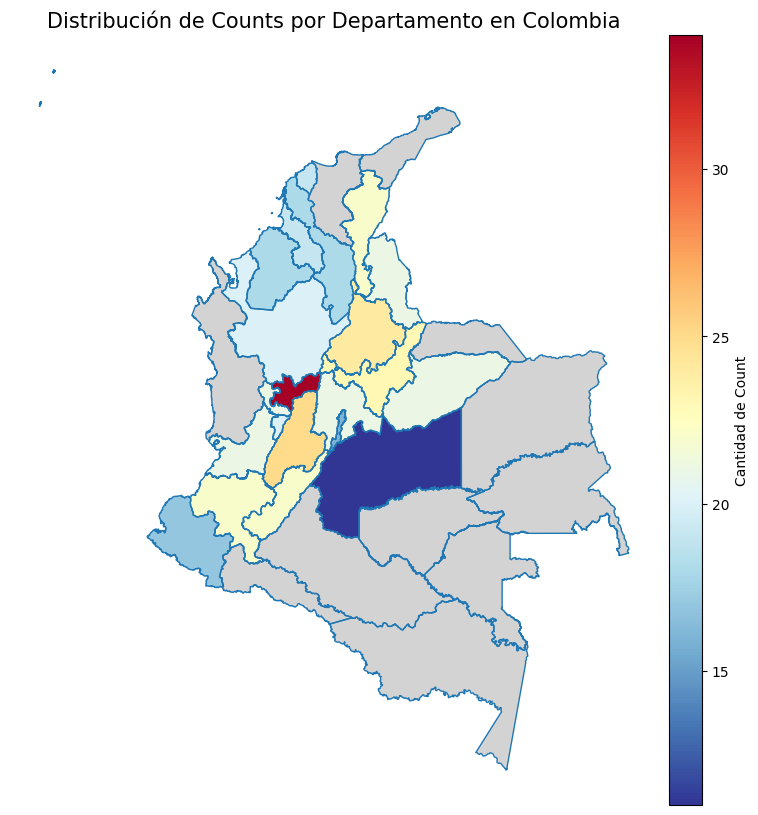

In [ ]:
# Limpiar el GeoDataFrame de columnas innecesarias (opcional)
# Asegúrate de mantener solo las columnas necesarias para el merge
colombia = colombia[['NOMBRE_DPT', 'geometry']]

# Unir los datos del DataFrame con el GeoDataFrame de Colombia
colombia = colombia.merge(yt, how='left', left_on='NOMBRE_DPT', right_on='TOP')

# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

colombia.boundary.plot(ax=ax, linewidth=1)
colombia.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
              legend_kwds={'label': "Cantidad de Count",
                           'orientation': "vertical"},
              missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por Departamento en Colombia', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

Shopping --1/1/2008-19/7/2024

***MUNDIAL***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Shopping/Mundial/relatedQueries (1) (2).csv')
print(yt)

                      TOP;COUNT
0          precio zanahoria;100
1           pastel zanahoria;70
2        precio de zanahoria;68
3        pastel de zanahoria;68
4                      crema;43
5                     aceite;43
6          kilo de zanahoria;41
7          jugo de zanahoria;40
8        aceite de zanahoria;33
9         crema de zanahoria;33
10  kilo de zanahoria precio;26
11    extractor de zanahoria;20


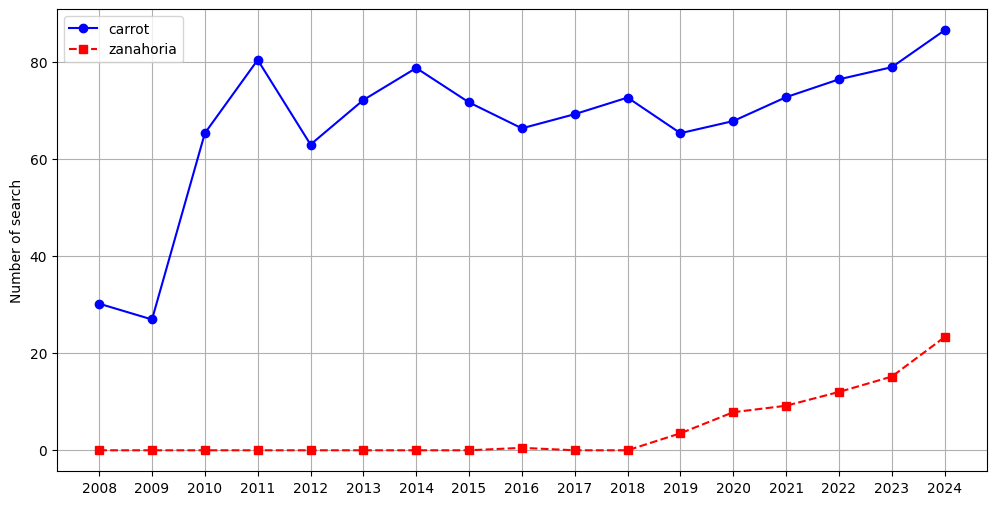

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Shopping/Mundial/ORIGINALES/multiTimeline (6).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

                TOP;COUNT                  TOP COUNT translated_TOP
0    precio zanahoria;100     precio zanahoria   100   Carrot price
1     pastel zanahoria;70     pastel zanahoria    70    Carrot cake
2  precio de zanahoria;68  precio de zanahoria    68   Carrot price
3  pastel de zanahoria;68  pastel de zanahoria    68    Carrot cake
4                crema;43                crema    43          crema


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

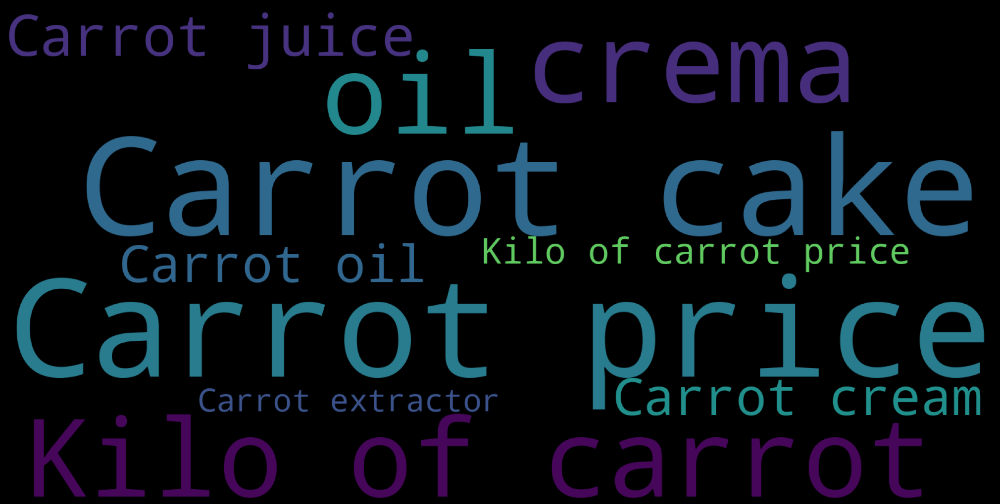

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                   TOP  COUNT  Percentage
0     precio zanahoria    100   17.094017
1     pastel zanahoria     70   11.965812
2  precio de zanahoria     68   11.623932
3  pastel de zanahoria     68   11.623932
4                crema     43    7.350427
5               aceite     43    7.350427
6    kilo de zanahoria     41    7.008547
7    jugo de zanahoria     40    6.837607
8  aceite de zanahoria     33    5.641026
9   crema de zanahoria     33    5.641026


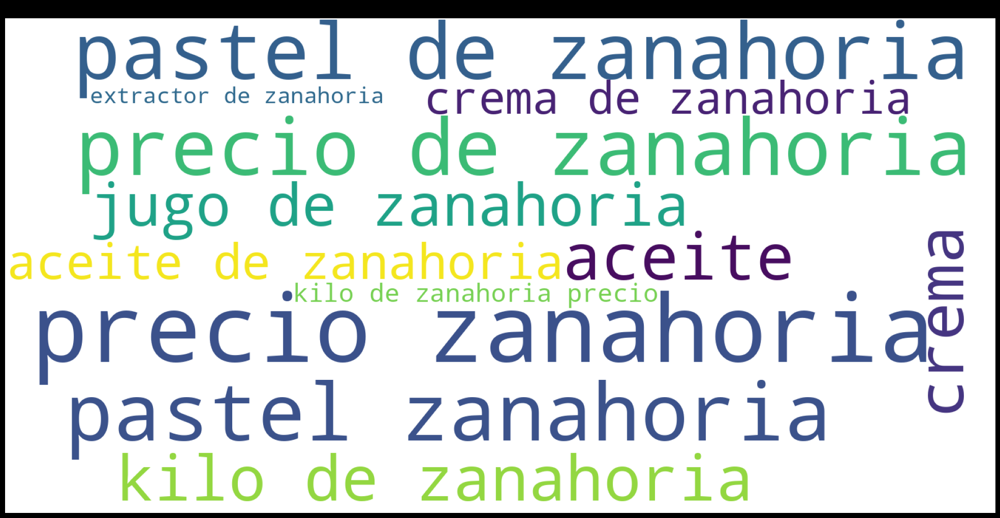

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Shopping/Mundial/relatedQueries (5).csv')
print(yt)

                TOP;COUNT
0         carrot cake;100
1                 cake;92
2           carrot oil;32
3         carrot juice;31
4         carrot jeans;20
5           carrot fit;15
6         carrot cream;15
7          carrot seed;15
8         carrot price;13
9          baby carrot;12
10        black carrot;12
11          toy carrot;12
12         carrot ring;11
13        carrot seeds;11
14        white carrot;11
15  carrot cake recipe;11
16             carrots;11
17         carrot soup;10
18       carrot costume;9
19      carrot seed oil;9
20           carrot top;8
21           red carrot;7


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

         TOP;COUNT           TOP COUNT translated_TOP
0  carrot cake;100   carrot cake   100    carrot cake
1          cake;92          cake    92           cake
2    carrot oil;32    carrot oil    32     carrot oil
3  carrot juice;31  carrot juice    31   carrot juice
4  carrot jeans;20  carrot jeans    20   carrot jeans


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

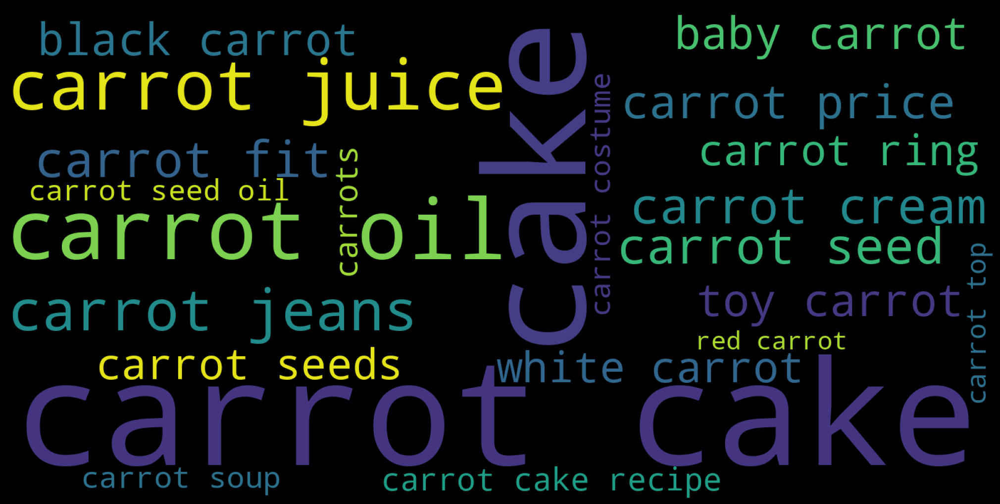

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
            TOP  COUNT  Percentage
0   carrot cake    100   21.413276
1          cake     92   19.700214
2    carrot oil     32    6.852248
3  carrot juice     31    6.638116
4  carrot jeans     20    4.282655
5    carrot fit     15    3.211991
6  carrot cream     15    3.211991
7   carrot seed     15    3.211991
8  carrot price     13    2.783726
9   baby carrot     12    2.569593


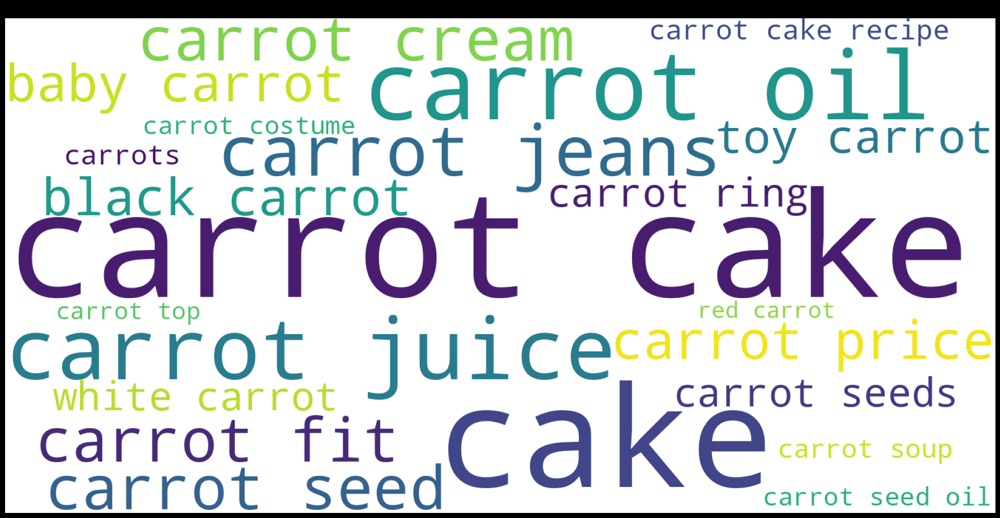

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/Zanahoria/Google/Shopping/Mundial/geoMap (1).csv')
print(yt)

            TOP;COUNT
0        Zimbabue;100
1             Belice;
2    Nueva Zelanda;46
3           Botsuana;
4              Bután;
..                ...
245           Kosovo;
246            Yemen;
247          Liberia;
248             Laos;
249          Comoras;

[250 rows x 1 columns]


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
import geopandas as gpd

# Cambia esta ruta por la ruta real donde descomprimiste el archivo
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Continúa con tu análisis


In [ ]:
yt['Country'] = yt['TOP'].replace({
    'USA': 'United States of America',
    'UK': 'United Kingdom',
    'San Pedro y Miquelón': 'Saint Pierre and Miquelon',
    'Corea del Sur': 'South Korea',
    'Corea del Norte': 'North Korea',
    'República Democrática del Congo': 'Democratic Republic of the Congo',
    'Costa Rica': 'Costa Rica',
    'Republica Dominicana': 'Dominican Republic',
})

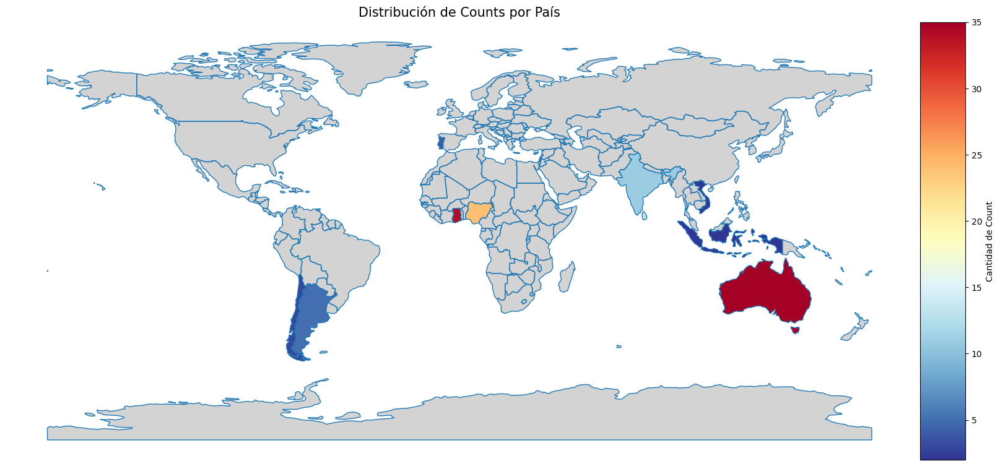

In [ ]:
import geopandas as gpd

# Cambia esta ruta por la ruta real donde descomprimiste el archivo
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Continúa con tu análisis
# Unir los datos del DataFrame con el GeoDataFrame del mundo
world = world.merge(yt, how='left', left_on='ADMIN', right_on='TOP')


# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

world.boundary.plot(ax=ax, linewidth=1)
world.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
           legend_kwds={'label': "Cantidad de Count",
                        'orientation': "vertical"},
           missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por País', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

***COLOMBIA***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/Zanahoria/Google/Shopping/Mundial/geoMap (3).csv')
print(yt)

                    TOP;COUNT
0                 Caquetá;100
1                 Casanare;81
2                  Quindío;80
3                   Caldas;67
4                    Cauca;59
5                Risaralda;59
6                   Tolima;52
7       Norte de Santander;50
8                Santander;47
9                    Huila;47
10                  Boyacá;47
11                   Cesar;46
12                   Sucre;43
13            Cundinamarca;42
14                  Nariño;41
15               Atlántico;39
16               Antioquia;39
17                 Córdoba;39
18         Valle del Cauca;37
19                 Bolívar;36
20                    Meta;34
21                  Bogotá;33
22               Magdalena;28
23                  Amazonas;
24                  Putumayo;
25                La Guajira;
26                  Guaviare;
27  San Andrés y Providencia;
28                   Guainía;
29                     Chocó;
30                    Arauca;
31                    Vaupés;
32        

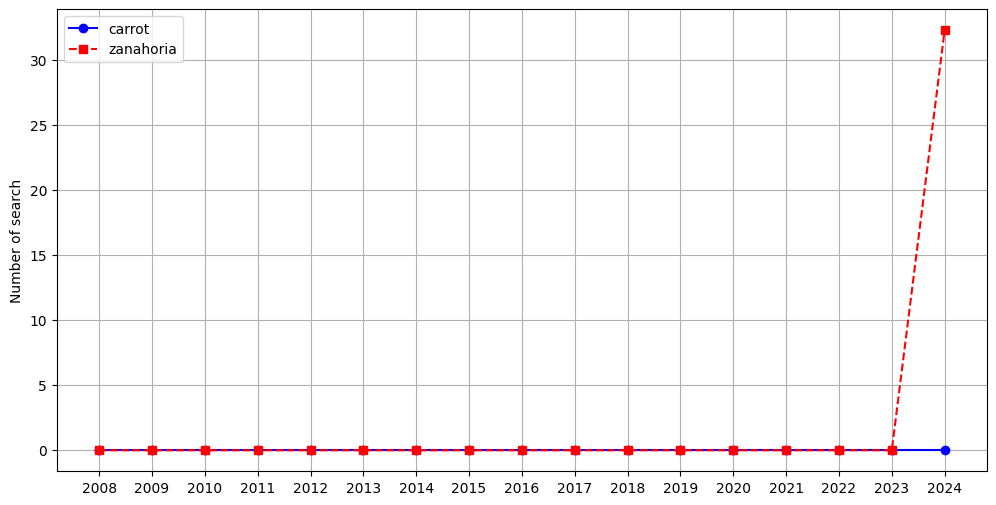

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/Zanahoria/Google/Shopping/Colombia/multiTimeline (7).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
colombia = gpd.read_file('/content/drive/MyDrive/Zanahoria/Google/Colombia_COVID19_Coronavirus_Departamento.zip')
print(colombia.head())

   OBJECTID DPTO    NOMBRE_DPT Coronaviru  Casos_Conf  \
0      1981   05     ANTIOQUIA         SI      943576   
1      1982   08     ATLÁNTICO         SI      415898   
2      1983   11  BOGOTÁ, D.C.         SI     1853689   
3      1984   13       BOLÍVAR         SI      202854   
4      1985   15        BOYACÁ         SI      129304   

                               GlobalID    Shape__Are    Shape__Len  \
0  f3e7e9f6-00d3-4fc9-8538-c77b5a00abf5  6.280472e+10  2.371289e+06   
1  b3bbb9c4-a3ae-4e99-a6e9-b3982e6bd48d  3.315729e+09  2.797921e+05   
2  c66916e1-f53b-4491-b1dc-682b0366fc68  1.622862e+09  4.164634e+05   
3  e7f6a781-010e-47b0-9a27-92b6669cf19d  2.671454e+10  1.734137e+06   
4  48ea4585-a3b0-4154-9874-8da7a886ed39  2.313817e+10  1.760491e+06   

                                            geometry  
0  POLYGON ((-76.4136 8.87397, -76.40203 8.84552,...  
1  POLYGON ((-74.84946 11.09778, -74.84938 11.097...  
2  POLYGON ((-74.07419 4.83655, -74.07398 4.83646...  
3  MULTIPO

In [ ]:
# Asegurar que los nombres de los departamentos en el shapefile coincidan con los del DataFrame
yt['TOP'] = yt['TOP'].replace({
    # Agrega mapeos según sea necesario, por ejemplo:
       'Bogotá': 'BOGOTÁ, D.C.',
    'Atlántico': 'ATLÁNTICO',
    'Antioquia': 'ANTIOQUIA',
    'Boyacá': 'BOYACÁ',
    'Caldas': 'CALDAS',
    'Arauca': 'ARAUCAS',
    'Vichada': 'VICHADA',
    'Putumayo': 'PUTUMAYO',
    'Huila': 'HUILA',
    'Quindío': 'QUINDÍO',
    'Valle del Cauca': 'VALLE DEL CAUCA',
    'Santander': 'SANTANDER',
    'Meta': 'META',
    'Risaralda': 'RISARALDA',
    'Cauca': 'CAUCA',
    'La Guajira': 'LA GUAJIRA',
    'Cesar': 'CESAR',
    'Casanare': 'CASANARE',
    'Sucre': 'SUCRE',
    'Nariño': 'NARIÑO',
    'Córdoba': 'CÓRDOBA',
    'Magdalena': 'MAGDALENA',
    'Bolívar': 'BOLÍVAR',
    'Tolima': 'TOLIMA',
    'Norte de Santander': 'NORTE DE SANTANDER',
    'San Andrés y Providencia': 'SAN ANDRÉS Y PROVIDENCIA',
    'Cundinamarca': 'CUNDINAMARCA',
})

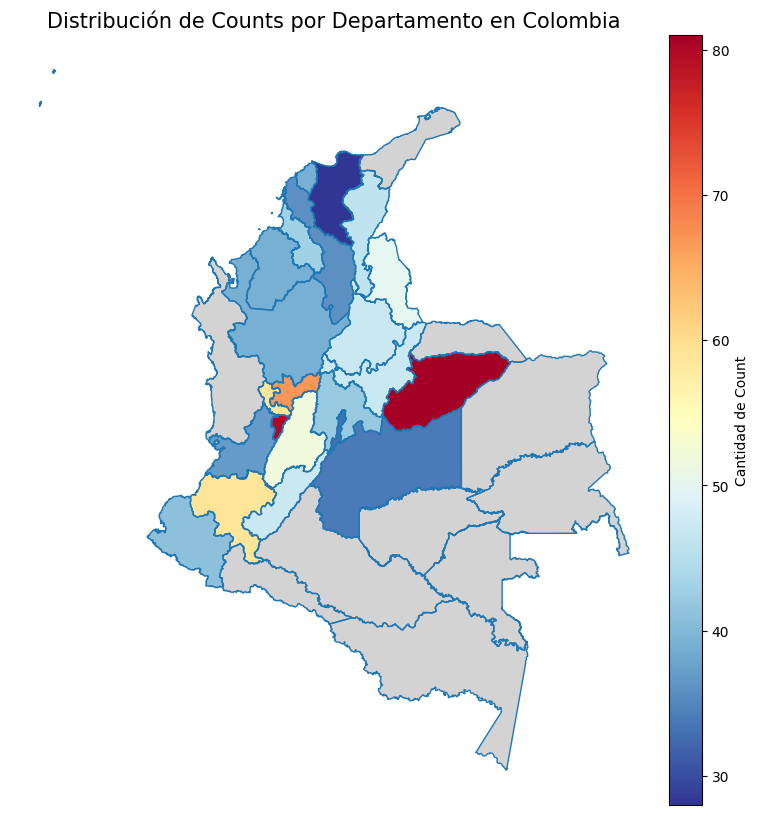

In [ ]:
# Limpiar el GeoDataFrame de columnas innecesarias (opcional)
# Asegúrate de mantener solo las columnas necesarias para el merge
colombia = colombia[['NOMBRE_DPT', 'geometry']]

# Unir los datos del DataFrame con el GeoDataFrame de Colombia
colombia = colombia.merge(yt, how='left', left_on='NOMBRE_DPT', right_on='TOP')

# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

colombia.boundary.plot(ax=ax, linewidth=1)
colombia.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
              legend_kwds={'label': "Cantidad de Count",
                           'orientation': "vertical"},
              missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por Departamento en Colombia', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

News --1/1/2008-19/7/2024

***MUNDIAL***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/News/Mundial/relatedQueries (1).csv')
print(yt)

                          TOP;COUNT
0                  la zanahoria;100
1            pastel de zanahoria;27
2              jugo de zanahoria;26
3             torta de zanahoria;20
4             crema de zanahoria;19
5          ensalada de zanahoria;17
6           zanahoria beneficios;16
7          zanahoria propiedades;13
8             bizcocho zanahoria;11
9             tarta de zanahoria;10
10          bizcocho de zanahoria;9
11               zanahoria dibujo;8
12            queque de zanahoria;8
13     beneficios de la zanahoria;7
14    propiedades de la zanahoria;7
15            que es la zanahoria;7
16     receta pastel de zanahoria;6
17               pan de zanahoria;6
18             calorias zanahoria;6
19  receta de pastel de zanahoria;6
20                color zanahoria;5
21    para que sirve la zanahoria;5
22          gelatina de zanahoria;5
23              zumo de zanahoria;5
24          recetas con zanahoria;4


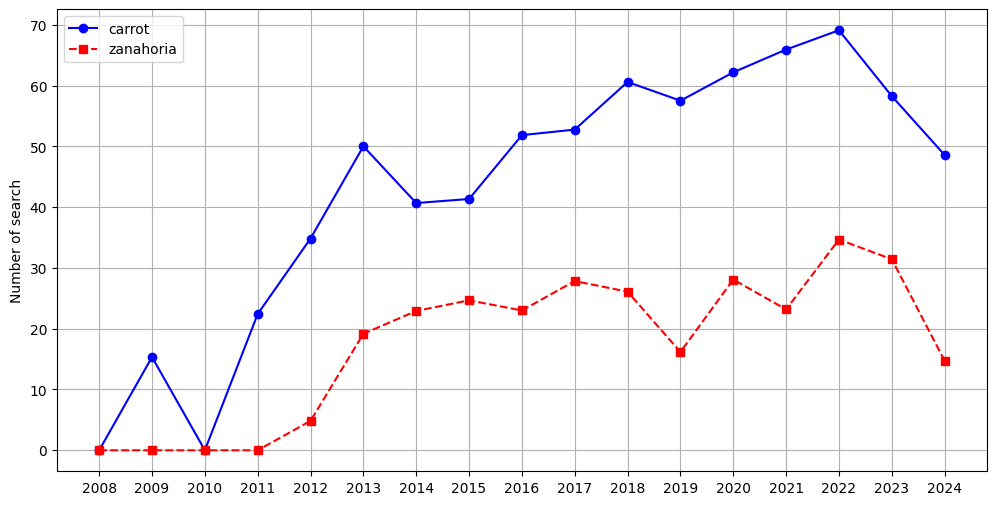

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/Zanahoria/Google/News/Mundial/ORIGINALES/multiTimeline (9).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

                TOP;COUNT                  TOP COUNT translated_TOP
0        la zanahoria;100         la zanahoria   100     The carrot
1  pastel de zanahoria;27  pastel de zanahoria    27    Carrot cake
2    jugo de zanahoria;26    jugo de zanahoria    26   Carrot juice
3   torta de zanahoria;20   torta de zanahoria    20    Carrot cake
4   crema de zanahoria;19   crema de zanahoria    19   Carrot cream


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

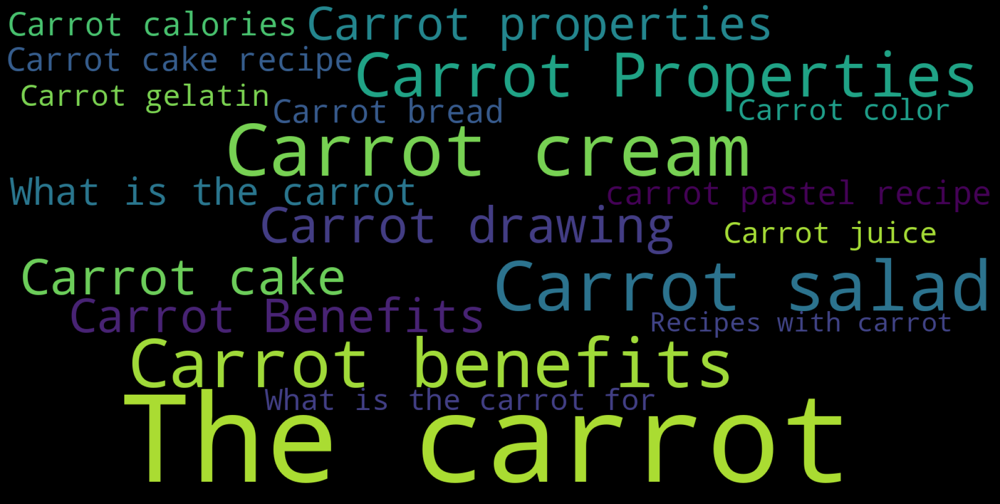

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                     TOP  COUNT  Percentage
0           la zanahoria    100   28.328612
1    pastel de zanahoria     27    7.648725
2      jugo de zanahoria     26    7.365439
3     torta de zanahoria     20    5.665722
4     crema de zanahoria     19    5.382436
5  ensalada de zanahoria     17    4.815864
6   zanahoria beneficios     16    4.532578
7  zanahoria propiedades     13    3.682720
8     bizcocho zanahoria     11    3.116147
9     tarta de zanahoria     10    2.832861


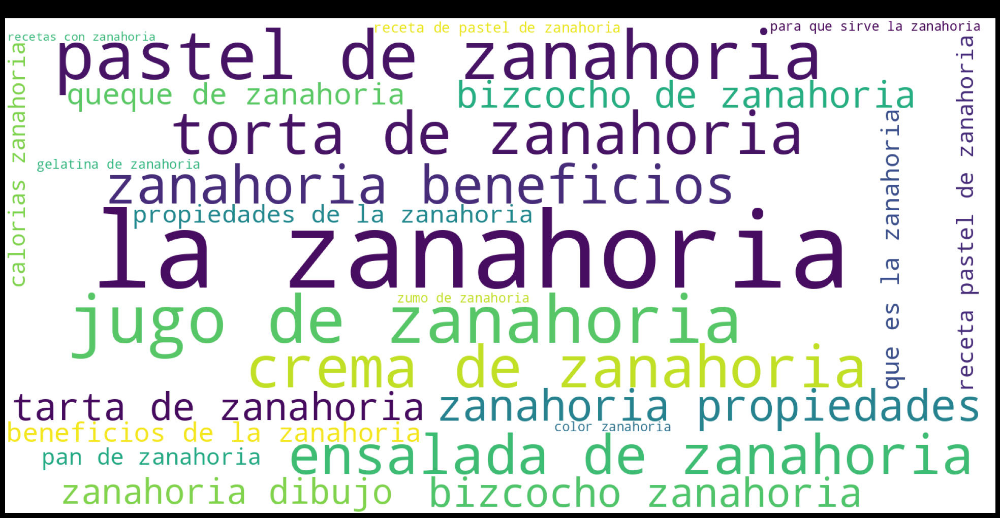

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/News/Mundial/relatedQueries (2).csv')
print(yt)

                  TOP;COUNT
0           carrot cake;100
1          carrot recipe;57
2             carrot top;51
3           carrot juice;35
4     carrot cake recipe;32
5            carrot soup;25
6         carrot recipes;18
7        carrot benefits;15
8           carrot halwa;12
9          purple carrot;11
10            carrot oil;11
11               carrots;11
12          carrot salad;10
13            carrot man;10
14           carrot stick;9
15        carrot calories;9
16       one piece carrot;8
17            baby carrot;7
18       kevin the carrot;7
19  carrot juice benefits;6
20         carrot muffins;6
21     carrot soup recipe;6
22       carrot and stick;5
23     benefits of carrot;5


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

               TOP;COUNT                 TOP COUNT      translated_TOP
0        carrot cake;100         carrot cake   100         carrot cake
1       carrot recipe;57       carrot recipe    57       carrot recipe
2          carrot top;51          carrot top    51          carrot top
3        carrot juice;35        carrot juice    35        carrot juice
4  carrot cake recipe;32  carrot cake recipe    32  carrot cake recipe


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

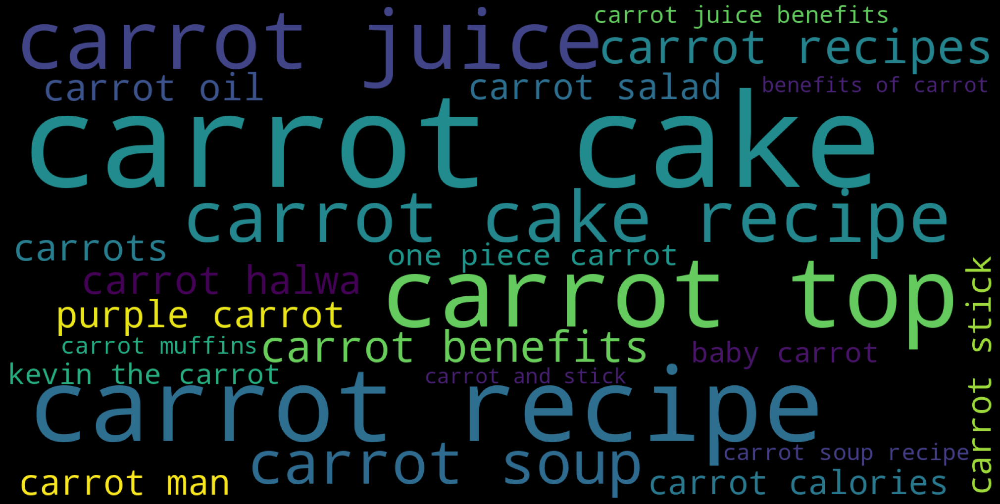

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                  TOP  COUNT  Percentage
0         carrot cake    100   21.459227
1       carrot recipe     57   12.231760
2          carrot top     51   10.944206
3        carrot juice     35    7.510730
4  carrot cake recipe     32    6.866953
5         carrot soup     25    5.364807
6      carrot recipes     18    3.862661
7     carrot benefits     15    3.218884
8        carrot halwa     12    2.575107
9       purple carrot     11    2.360515


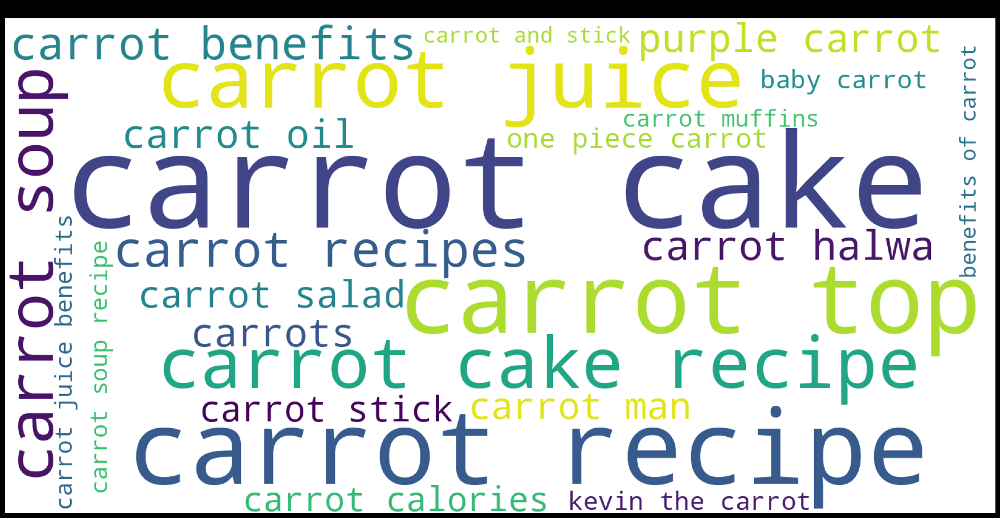

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/Zanahoria/Google/News/Mundial/geoMap.csv')
print(yt)

        TOP;COUNT
0    Botsuana;100
1    Zimbabue;100
2     Jamaica;100
3       Ghana;100
4     Nigeria;100
..            ...
245       Kosovo;
246        Yemen;
247      Liberia;
248       Zambia;
249   Mozambique;

[250 rows x 1 columns]


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
yt['Country'] = yt['TOP'].replace({
    'USA': 'United States of America',
    'UK': 'United Kingdom',
    'San Pedro y Miquelón': 'Saint Pierre and Miquelon',
    'Corea del Sur': 'South Korea',
    'Corea del Norte': 'North Korea',
    'República Democrática del Congo': 'Democratic Republic of the Congo',
    'Costa Rica': 'Costa Rica',
    'Republica Dominicana': 'Dominican Republic',
})

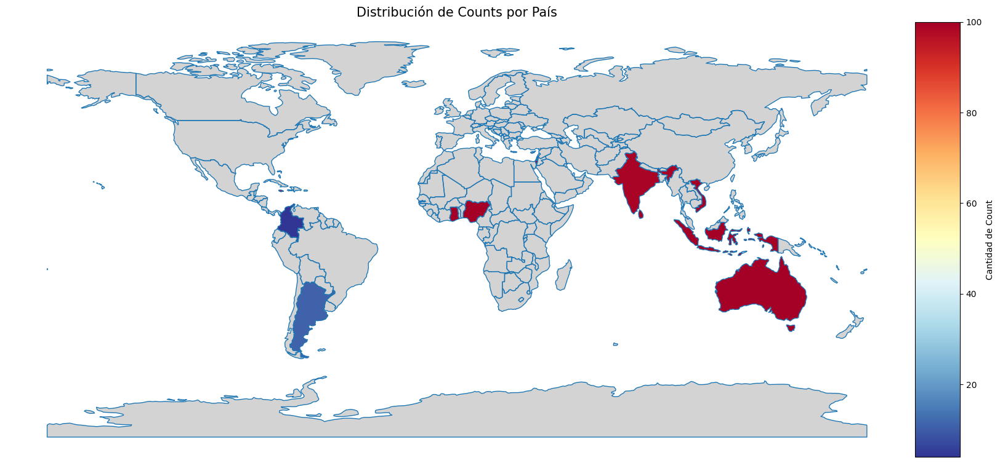

In [ ]:
import geopandas as gpd

# Cambia esta ruta por la ruta real donde descomprimiste el archivo
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Continúa con tu análisis
# Unir los datos del DataFrame con el GeoDataFrame del mundo
world = world.merge(yt, how='left', left_on='ADMIN', right_on='TOP')


# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

world.boundary.plot(ax=ax, linewidth=1)
world.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
           legend_kwds={'label': "Cantidad de Count",
                        'orientation': "vertical"},
           missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por País', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

***COLOMBIA***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/Zanahoria/Google/News/Colombia/geoMap (1).csv')
print(yt)

                    TOP;COUNT
0              La Guajira;100
1       Norte de Santander;81
2                Magdalena;79
3                  Bolívar;68
4                    Cesar;63
5             Cundinamarca;62
6                    Cauca;62
7                Santander;61
8          Valle del Cauca;59
9                Antioquia;58
10                 Quindío;50
11                  Boyacá;50
12                    Meta;48
13                   Huila;48
14               Risaralda;48
15                  Caldas;48
16                  Bogotá;47
17                  Tolima;47
18                  Nariño;42
19               Atlántico;42
20                 Córdoba;35
21                  Amazonas;
22                  Guaviare;
23                  Putumayo;
24                   Guainía;
25                     Chocó;
26                  Casanare;
27  San Andrés y Providencia;
28                     Sucre;
29                   Caquetá;
30                    Arauca;
31                    Vaupés;
32        

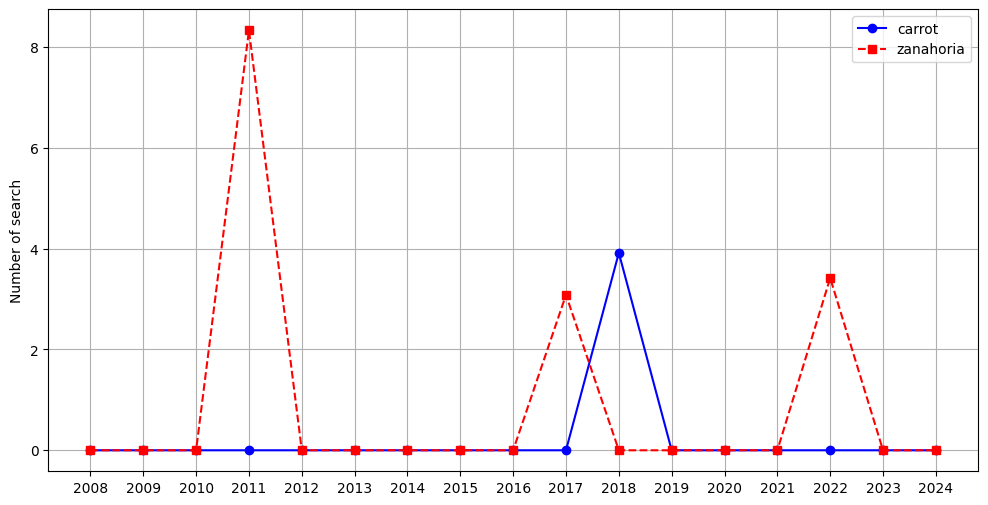

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/Zanahoria/Google/News/Colombia/multiTimeline (8).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
colombia = gpd.read_file('/content/drive/MyDrive/Zanahoria/Google/Colombia_COVID19_Coronavirus_Departamento.zip')
print(colombia.head())

   OBJECTID DPTO    NOMBRE_DPT Coronaviru  Casos_Conf  \
0      1981   05     ANTIOQUIA         SI      943576   
1      1982   08     ATLÁNTICO         SI      415898   
2      1983   11  BOGOTÁ, D.C.         SI     1853689   
3      1984   13       BOLÍVAR         SI      202854   
4      1985   15        BOYACÁ         SI      129304   

                               GlobalID    Shape__Are    Shape__Len  \
0  f3e7e9f6-00d3-4fc9-8538-c77b5a00abf5  6.280472e+10  2.371289e+06   
1  b3bbb9c4-a3ae-4e99-a6e9-b3982e6bd48d  3.315729e+09  2.797921e+05   
2  c66916e1-f53b-4491-b1dc-682b0366fc68  1.622862e+09  4.164634e+05   
3  e7f6a781-010e-47b0-9a27-92b6669cf19d  2.671454e+10  1.734137e+06   
4  48ea4585-a3b0-4154-9874-8da7a886ed39  2.313817e+10  1.760491e+06   

                                            geometry  
0  POLYGON ((-76.4136 8.87397, -76.40203 8.84552,...  
1  POLYGON ((-74.84946 11.09778, -74.84938 11.097...  
2  POLYGON ((-74.07419 4.83655, -74.07398 4.83646...  
3  MULTIPO

In [ ]:
# Asegurar que los nombres de los departamentos en el shapefile coincidan con los del DataFrame
yt['TOP'] = yt['TOP'].replace({
    # Agrega mapeos según sea necesario, por ejemplo:
       'Bogotá': 'BOGOTÁ, D.C.',
    'Atlántico': 'ATLÁNTICO',
    'Antioquia': 'ANTIOQUIA',
    'Boyacá': 'BOYACÁ',
    'Caldas': 'CALDAS',
    'Arauca': 'ARAUCAS',
    'Vichada': 'VICHADA',
    'Putumayo': 'PUTUMAYO',
    'Huila': 'HUILA',
    'Quindío': 'QUINDÍO',
    'Valle del Cauca': 'VALLE DEL CAUCA',
    'Santander': 'SANTANDER',
    'Meta': 'META',
    'Risaralda': 'RISARALDA',
    'Cauca': 'CAUCA',
    'La Guajira': 'LA GUAJIRA',
    'Cesar': 'CESAR',
    'Casanare': 'CASANARE',
    'Sucre': 'SUCRE',
    'Nariño': 'NARIÑO',
    'Córdoba': 'CÓRDOBA',
    'Magdalena': 'MAGDALENA',
    'Bolívar': 'BOLÍVAR',
    'Tolima': 'TOLIMA',
    'Norte de Santander': 'NORTE DE SANTANDER',
    'San Andrés y Providencia': 'SAN ANDRÉS Y PROVIDENCIA',
    'Cundinamarca': 'CUNDINAMARCA',
})

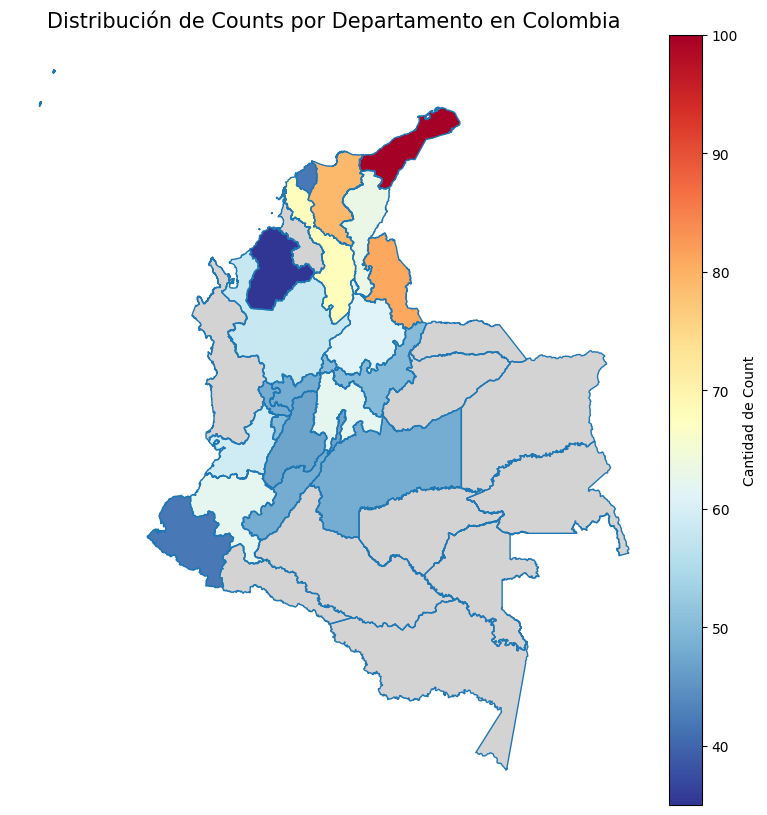

In [ ]:
# Limpiar el GeoDataFrame de columnas innecesarias (opcional)
# Asegúrate de mantener solo las columnas necesarias para el merge
colombia = colombia[['NOMBRE_DPT', 'geometry']]

# Unir los datos del DataFrame con el GeoDataFrame de Colombia
colombia = colombia.merge(yt, how='left', left_on='NOMBRE_DPT', right_on='TOP')

# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

colombia.boundary.plot(ax=ax, linewidth=1)
colombia.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
              legend_kwds={'label': "Cantidad de Count",
                           'orientation': "vertical"},
              missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por Departamento en Colombia', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

Images --1/1/2008-19/7/2024

***MUNDIAL***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Images/Mundial/relatedQueries (4).csv')
print(yt)

                        TOP;COUNT
0                la zanahoria;100
1             dibujo zanahoria;82
2           zanahoria colorear;69
3      zanahoria para colorear;68
4   beneficios de la zanahoria;66
5        cupcakes de zanahoria;53
6                una zanahoria;62
7          dibujo de zanahoria;40
8                     ensalada;38
9                       pastel;35
10            pastel zanahoria;34
11           zanahoria animado;34
12                      frutas;33
13       ensalada de zanahoria;33
14         pastel de zanahoria;31


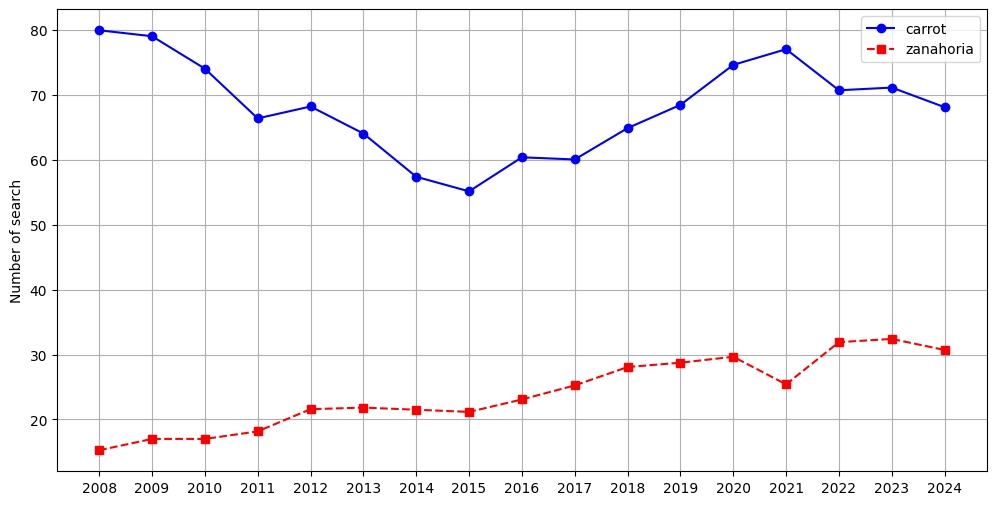

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/Zanahoria/Google/Images/Mundial/multiTimeline.csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

                       TOP;COUNT                         TOP COUNT  \
0               la zanahoria;100                la zanahoria   100   
1            dibujo zanahoria;82            dibujo zanahoria    82   
2          zanahoria colorear;69          zanahoria colorear    69   
3     zanahoria para colorear;68     zanahoria para colorear    68   
4  beneficios de la zanahoria;66  beneficios de la zanahoria    66   

        translated_TOP  
0           The carrot  
1       Carrot drawing  
2      Carrot coloring  
3  Carrot for coloring  
4      Carrot Benefits  


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['translated_TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

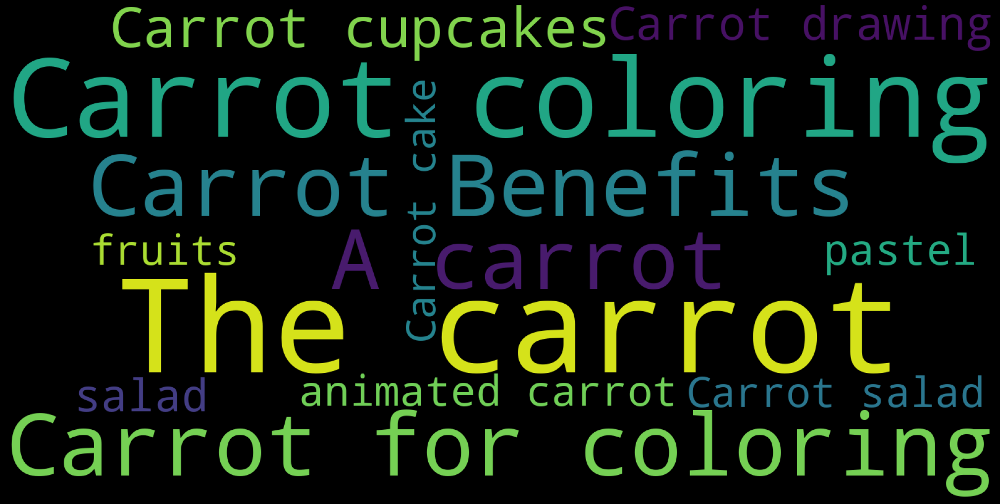

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
                          TOP  COUNT  Percentage
0                la zanahoria    100   12.853470
1            dibujo zanahoria     82   10.539846
2          zanahoria colorear     69    8.868895
3     zanahoria para colorear     68    8.740360
4  beneficios de la zanahoria     66    8.483290
6               una zanahoria     62    7.969152
5       cupcakes de zanahoria     53    6.812339
7         dibujo de zanahoria     40    5.141388
8                    ensalada     38    4.884319
9                      pastel     35    4.498715


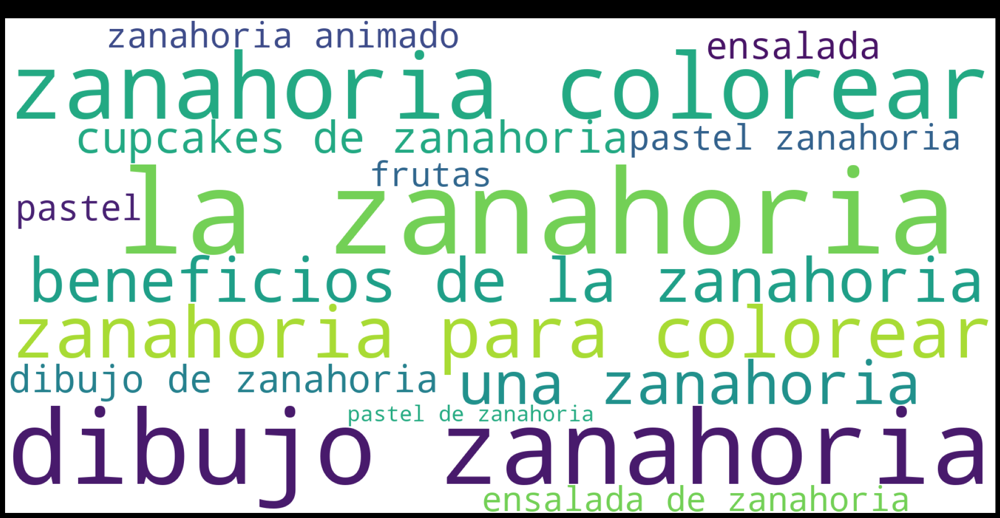

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/TESIS_ZANAHORIA/Google/Images/Mundial/relatedQueries (3).csv')
print(yt)

              TOP;COUNT
0       carrot cake;100
1         carrot top;95
2               cake;95
3     carrot cartoon;41
4             orange;33
5     clipart carrot;31
6         one carrot;31
7       white carrot;31
8     carrot drawing;24
9            carrots;24
10     rabbit carrot;23
11  one piece carrot;23
12      black carrot;23
13              food;23
14             fruit;22
15        vegetables;22
16  carrot vegetable;20


In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
print(yt.columns)

Index(['TOP;COUNT', 'TOP', 'COUNT'], dtype='object')


In [ ]:
translator = GoogleTranslator(source='auto', target='en')
yt['translated_TOP'] = yt['TOP'].apply(translator.translate)
print(yt.head())

           TOP;COUNT             TOP COUNT  translated_TOP
0    carrot cake;100     carrot cake   100     carrot cake
1      carrot top;95      carrot top    95      carrot top
2            cake;95            cake    95            cake
3  carrot cartoon;41  carrot cartoon    41  carrot cartoon
4          orange;33          orange    33          orange


In [ ]:
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
term_frequencies = dict(zip(yt['TOP'], yt['COUNT']))

In [ ]:
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
stopwords_1 = set(stopwords.words('spanish', 'english'))
stopwords_1.update([ "the","with","of"])
wordcloud = WordCloud(stopwords=stopwords_1, background_color="white").generate_from_frequencies(term_frequencies)

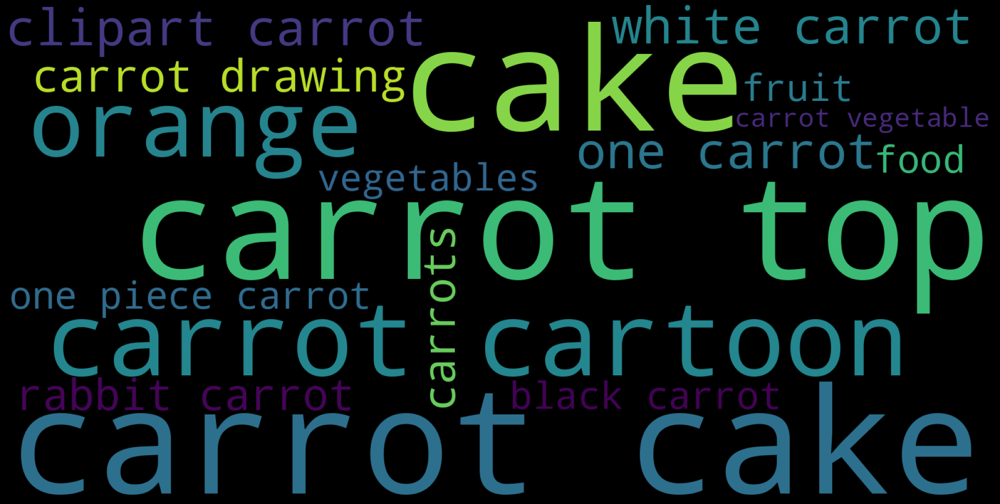

In [ ]:
wordcloud = WordCloud( stopwords = stopwords_1,width=1600, height=800).generate_from_frequencies(term_frequencies)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Términos más buscados en YouTube (Español):
              TOP  COUNT  Percentage
0     carrot cake    100   15.128593
1      carrot top     95   14.372163
2            cake     95   14.372163
3  carrot cartoon     41    6.202723
4          orange     33    4.992436
5  clipart carrot     31    4.689864
6      one carrot     31    4.689864
7    white carrot     31    4.689864
8  carrot drawing     24    3.630862
9         carrots     24    3.630862


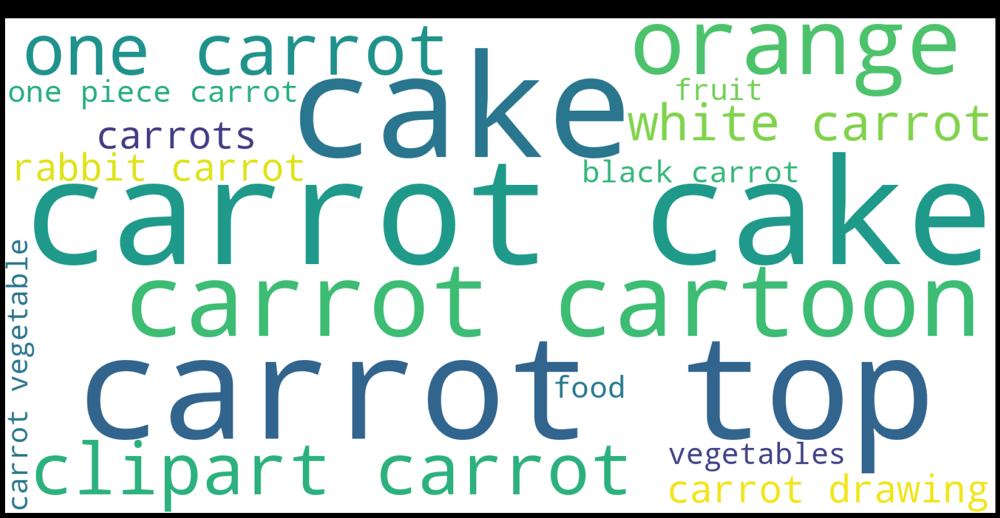

In [ ]:
# Ejemplo para YouTube en español (Figura 4B)
# Calcular porcentajes
total_searches = yt['COUNT'].sum()
yt['Percentage'] = (yt['COUNT'] / total_searches) * 100

# Mostrar tabla con los términos más buscados
print("Términos más buscados en YouTube (Español):")
print(yt[['TOP', 'COUNT', 'Percentage']].sort_values(by='COUNT', ascending=False).head(10))

# Modificar el WordCloud para reflejar porcentajes
term_frequencies = dict(zip(yt['TOP'], yt['Percentage']))  # Usar porcentajes en lugar de conteos

wordcloud = WordCloud(stopwords=stopwords_1, width=1600, height=800,
                      background_color='white', colormap='viridis',
                      min_font_size=10).generate_from_frequencies(term_frequencies)

plt.figure(figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.title('Términos de búsqueda en YouTube (Español) - Tamaño proporcional al % de aparición', fontsize=15)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/Zanahoria/Google/Images/Mundial/geoMap (2).csv')
print(yt)

                     Pais;COUNT
0                  Botsuana;100
1                  Zimbabue;100
2                   Jamaica;100
3                     Dominica;
4    Islas Vírgenes Británicas;
..                          ...
245          Guinea Ecuatorial;
246                       Niue;
247   República Centroafricana;
248                      Nauru;
249                 San Marino;

[250 rows x 1 columns]


In [ ]:
yt[['Pais', 'COUNT']] = yt['Pais;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
yt['Country'] = yt['Pais'].replace({
    'USA': 'United States of America',
    'UK': 'United Kingdom',
    'San Pedro y Miquelón': 'Saint Pierre and Miquelon',
    'Corea del Sur': 'South Korea',
    'Corea del Norte': 'North Korea',
    'República Democrática del Congo': 'Democratic Republic of the Congo',
    'Costa Rica': 'Costa Rica',
    'Republica Dominicana': 'Dominican Republic',
})

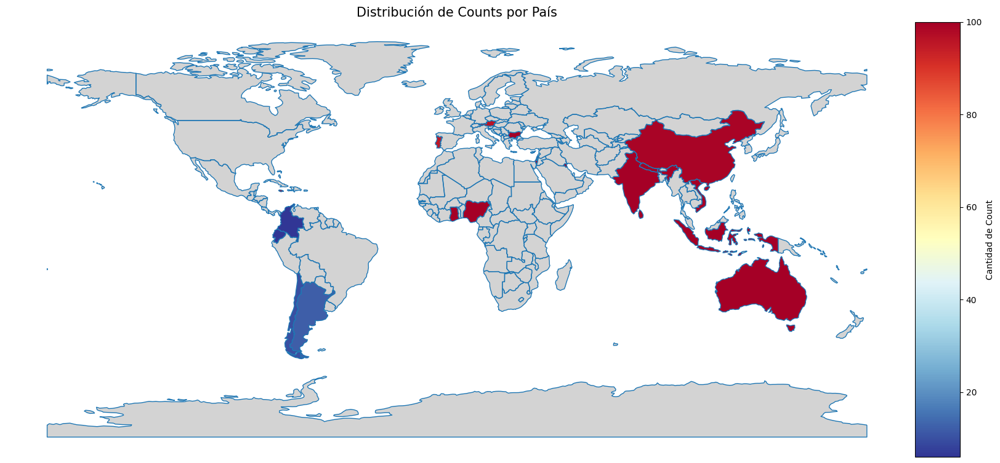

In [ ]:
import geopandas as gpd

# Cambia esta ruta por la ruta real donde descomprimiste el archivo
path_to_file = '/content/drive/MyDrive/Colab Notebooks/ne_110m_admin_0_countries.zip'
world = gpd.read_file(path_to_file)

# Continúa con tu análisis
# Unir los datos del DataFrame con el GeoDataFrame del mundo
world = world.merge(yt, how='left', left_on='ADMIN', right_on='Pais')


# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

world.boundary.plot(ax=ax, linewidth=1)
world.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
           legend_kwds={'label': "Cantidad de Count",
                        'orientation': "vertical"},
           missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por País', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()

***COLOMBIA***

In [ ]:
yt= pd.read_csv('/content/drive/MyDrive/Zanahoria/Google/Images/Colombia/geoMap (3).csv')
print(yt)

                    TOP;COUNT
0                Amazonas;100
1                  Córdoba;88
2                  Quindío;92
3                    Cesar;93
4                Atlántico;91
5                   Caldas;94
6                    Huila;94
7                Santander;93
8                  Bolívar;93
9                   Boyacá;95
10            Cundinamarca;92
11                  Bogotá;93
12               Antioquia;93
13         Valle del Cauca;92
14                  Tolima;95
15               Magdalena;94
16               Risaralda;94
17      Norte de Santander;95
18                   Cauca;97
19                    Meta;96
20                  Nariño;97
21                  Guaviare;
22             La Guajira;100
23               Putumayo;100
24                   Guainía;
25                  Chocó;100
26               Casanare;100
27  San Andrés y Providencia;
28                  Sucre;100
29                Caquetá;100
30                 Arauca;100
31                    Vaupés;
32        

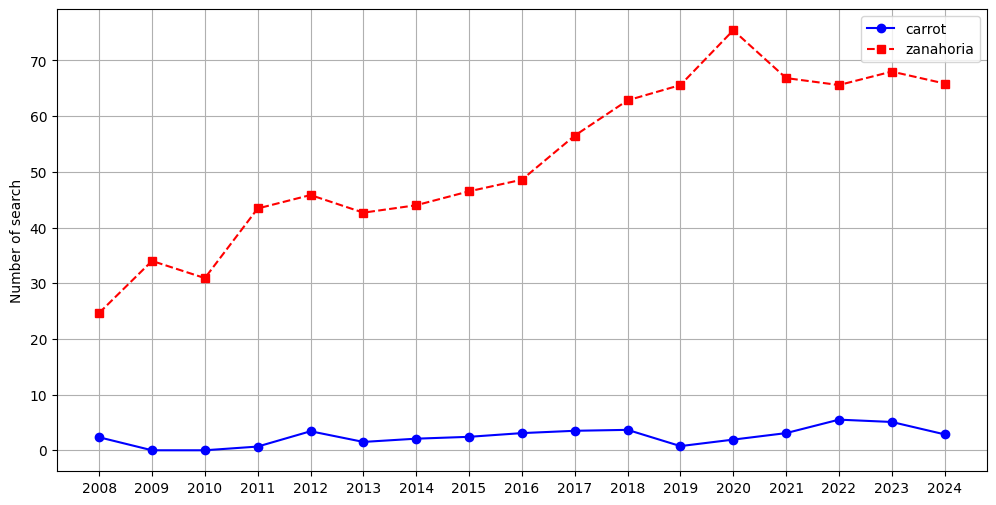

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV (ajusta la ruta si es necesario)
file_path = "/content/drive/MyDrive/Zanahoria/Google/Images/Colombia/multiTimeline (1).csv"  # Cambia el nombre si es diferente

# Leer el CSV asegurando que la primera columna sea una fecha
df = pd.read_csv(file_path, parse_dates=[0])

# Limpiar nombres de columnas eliminando espacios en blanco
df.columns = df.columns.str.strip()

# Renombrar la primera columna a 'Fecha' para mejor manejo
df.rename(columns={df.columns[0]: 'Fecha'}, inplace=True)

# Extraer el año de la fecha
df['Año'] = df['Fecha'].dt.year

# Agrupar por año y calcular el promedio de los valores de búsqueda
df_anual = df.groupby('Año').mean()

# Crear la gráfica con los valores anuales
plt.figure(figsize=(12, 6))
plt.plot(df_anual.index, df_anual[df.columns[1]], label=df.columns[1], linestyle='-', marker='o', color='blue')
plt.plot(df_anual.index, df_anual[df.columns[2]], label=df.columns[2], linestyle='--', marker='s', color='red')

# Personalizar el gráfico
plt.ylabel('Number of search')
plt.xticks(df_anual.index)  # Mostrar los años en el eje X
plt.legend()
plt.grid()

# Mostrar la gráfica
plt.show()

In [ ]:
yt[['TOP', 'COUNT']] = yt['TOP;COUNT'].str.split(';', expand=True)
yt['COUNT'] = pd.to_numeric(yt['COUNT'], errors='coerce')
yt = yt.dropna(subset=['COUNT'])

In [ ]:
colombia = gpd.read_file('/content/drive/MyDrive/Zanahoria/Google/Colombia_COVID19_Coronavirus_Departamento.zip')
print(colombia.head())

   OBJECTID DPTO    NOMBRE_DPT Coronaviru  Casos_Conf  \
0      1981   05     ANTIOQUIA         SI      943576   
1      1982   08     ATLÁNTICO         SI      415898   
2      1983   11  BOGOTÁ, D.C.         SI     1853689   
3      1984   13       BOLÍVAR         SI      202854   
4      1985   15        BOYACÁ         SI      129304   

                               GlobalID    Shape__Are    Shape__Len  \
0  f3e7e9f6-00d3-4fc9-8538-c77b5a00abf5  6.280472e+10  2.371289e+06   
1  b3bbb9c4-a3ae-4e99-a6e9-b3982e6bd48d  3.315729e+09  2.797921e+05   
2  c66916e1-f53b-4491-b1dc-682b0366fc68  1.622862e+09  4.164634e+05   
3  e7f6a781-010e-47b0-9a27-92b6669cf19d  2.671454e+10  1.734137e+06   
4  48ea4585-a3b0-4154-9874-8da7a886ed39  2.313817e+10  1.760491e+06   

                                            geometry  
0  POLYGON ((-76.4136 8.87397, -76.40203 8.84552,...  
1  POLYGON ((-74.84946 11.09778, -74.84938 11.097...  
2  POLYGON ((-74.07419 4.83655, -74.07398 4.83646...  
3  MULTIPO

In [ ]:
# Asegurar que los nombres de los departamentos en el shapefile coincidan con los del DataFrame
yt['TOP'] = yt['TOP'].replace({
    # Agrega mapeos según sea necesario, por ejemplo:
       'Bogotá': 'BOGOTÁ, D.C.',
    'Atlántico': 'ATLÁNTICO',
    'Antioquia': 'ANTIOQUIA',
    'Boyacá': 'BOYACÁ',
    'Caldas': 'CALDAS',
    'Arauca': 'ARAUCAS',
    'Vichada': 'VICHADA',
    'Putumayo': 'PUTUMAYO',
    'Huila': 'HUILA',
    'Quindío': 'QUINDÍO',
    'Valle del Cauca': 'VALLE DEL CAUCA',
    'Santander': 'SANTANDER',
    'Meta': 'META',
    'Risaralda': 'RISARALDA',
    'Cauca': 'CAUCA',
    'La Guajira': 'LA GUAJIRA',
    'Cesar': 'CESAR',
    'Casanare': 'CASANARE',
    'Sucre': 'SUCRE',
    'Nariño': 'NARIÑO',
    'Córdoba': 'CÓRDOBA',
    'Magdalena': 'MAGDALENA',
    'Bolívar': 'BOLÍVAR',
    'Tolima': 'TOLIMA',
    'Norte de Santander': 'NORTE DE SANTANDER',
    'San Andrés y Providencia': 'SAN ANDRÉS Y PROVIDENCIA',
    'Cundinamarca': 'CUNDINAMARCA',
})

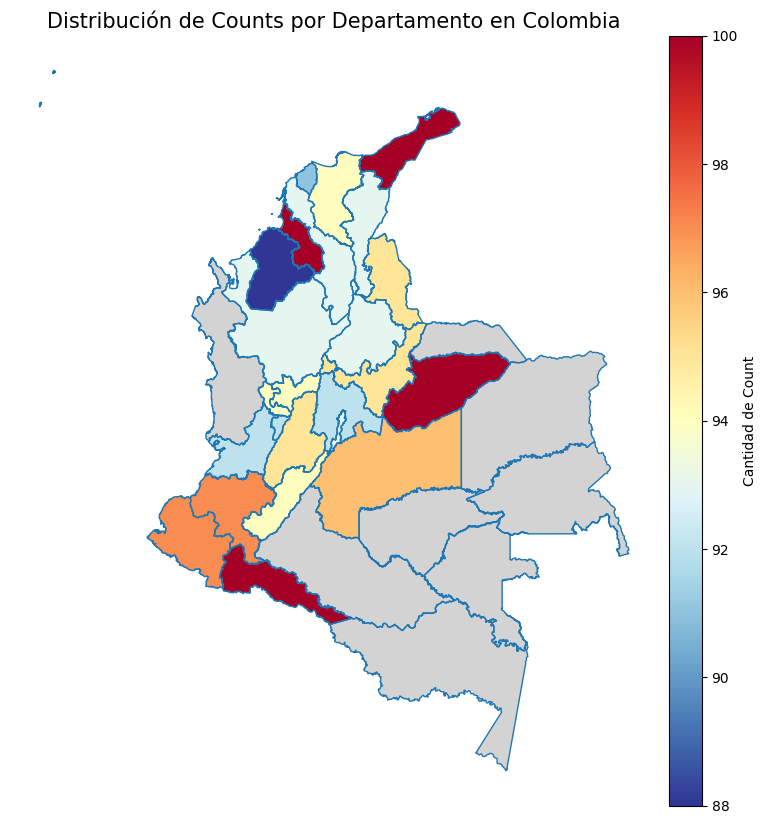

In [ ]:
# Limpiar el GeoDataFrame de columnas innecesarias (opcional)
# Asegúrate de mantener solo las columnas necesarias para el merge
colombia = colombia[['NOMBRE_DPT', 'geometry']]

# Unir los datos del DataFrame con el GeoDataFrame de Colombia
colombia = colombia.merge(yt, how='left', left_on='NOMBRE_DPT', right_on='TOP')

# Crear el mapa de coropletas
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

colombia.boundary.plot(ax=ax, linewidth=1)
colombia.plot(column='COUNT', ax=ax, legend=True, cmap='RdYlBu_r', cax=cax,  # Cambiado aquí
              legend_kwds={'label': "Cantidad de Count",
                           'orientation': "vertical"},
              missing_kwds={"color": "lightgrey", "label": "No data"})

# Estilo del mapa
ax.set_title('Distribución de Counts por Departamento en Colombia', fontsize=15)
ax.set_axis_off()

# Mostrar el mapa
plt.show()